Google_Trends_Analysis.ipnyb

John Kearns and Gail Parambi

From initial pull of data in R, assemble regression dataset and run various models

Date Created: 2022-11-25
Last Updated: 2022-11-25

In [1]:
# set folders
master_dir = "C:/Users/16094/Documents/Year 1 - Princeton/Fall 2022/Fintech/Project/Fintech-Trends-and-State-and-Local-Finance/"
do_folder = master_dir+"Do/"
data_folder =  master_dir+"Data/"
results_folder =  master_dir+"Results/"
charts_folder =  master_dir+"Charts/"

In [2]:
# you may have pip3 installed, in which case run "pip3 install..."
#!pip install dill numpy pandas pmdarima

# pytorch has a little more involved install command, this for windows
#!pip install torch==1.8.1+cpu torchvision==0.9.1+cpu torchaudio===0.8.1 -f https://download.pytorch.org/whl/torch_stable.html

# then finally
#!pip install nowcast-lstm

In [2]:
# Import relevant packages
# !pip install xlrd
import matplotlib.pyplot as plt
%matplotlib inline

import warnings
import numpy as np
import pandas as pd
import seaborn as sns
import statistics
import itertools
import pyreadr
from fredapi import Fred
import time
import datetime

from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import plot_confusion_matrix, auc, roc_curve, plot_roc_curve, plot_precision_recall_curve
from sklearn.metrics import make_scorer, accuracy_score, recall_score, roc_auc_score, precision_score
from sklearn.model_selection import cross_val_score, train_test_split, GridSearchCV
from sklearn.svm import SVC, LinearSVC
from sklearn.tree import DecisionTreeRegressor
from sklearn.tree import plot_tree
from sklearn.inspection import permutation_importance
from sklearn.ensemble import RandomForestRegressor, BaggingClassifier, AdaBoostRegressor
from sklearn.model_selection import cross_val_score, train_test_split, GridSearchCV
import statsmodels.api as sm
from statsmodels.tools.eval_measures import rmse
from sklearn.metrics import r2_score, mean_squared_error
from sklearn.model_selection import RepeatedKFold
from sklearn.linear_model import ElasticNet
from sklearn.decomposition import PCA
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras import metrics
from tensorflow.keras.wrappers.scikit_learn import KerasRegressor
import math
from keras.utils.vis_utils import plot_model
import dill # for loading and saving a trained model
from nowcast_lstm.LSTM import LSTM
from nowcast_lstm.model_selection import variable_selection, hyperparameter_tuning, select_model

# select only the 50 US states
%run -i "C:/Users/16094/Documents/Year 1 - Princeton/Fall 2022/Fintech/Project/Fintech-Trends-and-State-and-Local-Finance/Data/Raw/us_state_abbreviations.py"

c:\Users\16094\AppData\Local\R-MINI~1\lib\site-packages\tqdm\auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [3]:
dill.load_session(data_folder+'Processing/notebook_env.db')

Keras model archive loading:
File Name                                             Modified             Size
config.json                                    2022-12-05 18:18:36         3308
metadata.json                                  2022-12-05 18:18:36           64
variables.h5                                   2022-12-05 18:18:36       710176
Keras weights file (<HDF5 file "variables.h5" (mode r)>) loading:
...layers\dense
......vars
.........0
.........1
...layers\dense_1
......vars
.........0
.........1
...layers\dense_2
......vars
.........0
.........1
...layers\dense_3
......vars
.........0
.........1
...layers\dense_4
......vars
.........0
.........1
...layers\dropout
......vars
...layers\dropout_1
......vars
...layers\dropout_2
......vars
...layers\dropout_3
......vars
...metrics\mean
......vars
.........0
.........1
...metrics\mean_metric_wrapper
......vars
.........0
.........1
...optimizer
......vars
.........0
.........1
.........10
.........11
.........12
.........13
...

In [20]:
# Pull dependent variable (Gross State Product) and other external variables

# initialize FRED api 
fred_key = '170531604ba9e3b805b9635fbd6aa9b7'
fred = Fred(api_key=fred_key)
gsp_df = fred.search('real gross domestic product all industry', filter=('frequency', 'Quarterly'))
gsp_df = gsp_df.query('seasonal_adjustment_short == "SAAR"  and units == "Millions of Chained 2012 Dollars"')
gsp_df = gsp_df.loc[gsp_df['title'].str.contains('Gross Domestic Product: All Industry Total in')]

gsp_df['state_abbrev'] = gsp_df['id'].str[:2]

In [21]:
gsp_df = gsp_df[gsp_df['state_abbrev'].isin(states.keys())&~gsp_df["title"].str.contains("BEA Region")]
# only 50 US states are left, no DC

# pull actual data
all_results = []

for myid in gsp_df.index:
    results = fred.get_series(myid)
    results = results.to_frame(name=myid)
    all_results.append(results)
    time.sleep(0.1)
gsp_results = pd.concat(all_results, axis=1)
gsp_results.reset_index(inplace=True)

gsp_results.to_csv(data_folder+"Raw/gdp_data.csv",index=True)

In [22]:
gsp_results1 = pd.melt(gsp_results,id_vars="index", value_vars=gsp_results.columns)
gsp_results1['state_abbrev'] = gsp_results1['variable'].str[:2]
gsp_results1 = gsp_results1.rename({'index': 'date', 'value': 'rgsp'}, axis=1)

In [23]:
# calculate rgsp yoy pchange
gsp_results1['rgsp_yoy_pchange'] = gsp_results1.groupby(['state_abbrev']).rgsp.pct_change(4).apply(lambda x: x*100)
gsp_results1['lag1_rgsp_yoy_pchange'] = gsp_results1.groupby(['state_abbrev']).rgsp_yoy_pchange.shift(1)
gsp_results1['lag2_rgsp_yoy_pchange'] = gsp_results1.groupby(['state_abbrev']).rgsp_yoy_pchange.shift(2)
gsp_results1['lag3_rgsp_yoy_pchange'] = gsp_results1.groupby(['state_abbrev']).rgsp_yoy_pchange.shift(3)
gsp_results1['lag4_rgsp_yoy_pchange'] = gsp_results1.groupby(['state_abbrev']).rgsp_yoy_pchange.shift(4)

# filter to time we need (2016 onwards)
gsp_results1.set_index(['date'],inplace=True)
gsp_results1 = gsp_results1.loc['2016-01-01':'2022-04-01']

# get month and year variables
gsp_results1['year'] = pd.DatetimeIndex(gsp_results1.index).year
gsp_results1['quarter'] = pd.DatetimeIndex(gsp_results1.index).quarter

In [24]:
# clean the trends data
# load data from R (the wide Google Trends YoY percent change)
trends_sa_wide_pchange_yoy = pyreadr.read_r(data_folder+"Processing/GT_wide_pchange.RData")

print(trends_sa_wide_pchange_yoy.keys()) # let's check what objects we got
trends_sa_wide_pchange_yoy = trends_sa_wide_pchange_yoy["trends_sa_wide_pchange_yoy"]

# clip the Google Trends data so outliers arent screwing up the data
clip=True
if(clip):
  for col in trends_sa_wide_pchange_yoy.columns[3:]: 
  
    perc_up = 1.0
    upper = trends_sa_wide_pchange_yoy[col].quantile(perc_up)
    while upper > 100:
      perc_up = perc_up-.01
      upper = trends_sa_wide_pchange_yoy[col].quantile(perc_up)
      
    
    perc_low = 0
    lower = trends_sa_wide_pchange_yoy[col].quantile(perc_low)
    while lower < (-50):
      perc_low = perc_low+.01
      lower = trends_sa_wide_pchange_yoy[col].quantile(perc_low)
    
    trends_sa_wide_pchange_yoy.loc[trends_sa_wide_pchange_yoy[col]>upper,col] = upper
    trends_sa_wide_pchange_yoy.loc[trends_sa_wide_pchange_yoy[col]<lower,col] = lower
    
    print(trends_sa_wide_pchange_yoy.columns.get_loc(col)/len(trends_sa_wide_pchange_yoy.columns))

trends_sa_wide_pchange_yoy.set_index(['date'],inplace=True)
trends_sa_wide_pchange_yoy['year'] = pd.DatetimeIndex(trends_sa_wide_pchange_yoy.index).year
trends_sa_wide_pchange_yoy['quarter'] = pd.DatetimeIndex(trends_sa_wide_pchange_yoy.index).quarter

trends_sa_wide_pchange_yoy_quarterly = trends_sa_wide_pchange_yoy.groupby(['state','year','quarter']).mean()
trends_sa_wide_pchange_yoy_quarterly.reset_index(inplace=True)

odict_keys(['trends_sa_wide_pchange_yoy'])
0.013636363636363636
0.01818181818181818
0.022727272727272728
0.02727272727272727
0.031818181818181815
0.03636363636363636
0.04090909090909091
0.045454545454545456
0.05
0.05454545454545454
0.05909090909090909
0.06363636363636363
0.06818181818181818
0.07272727272727272
0.07727272727272727
0.08181818181818182
0.08636363636363636
0.09090909090909091
0.09545454545454546
0.1
0.10454545454545454
0.10909090909090909
0.11363636363636363
0.11818181818181818
0.12272727272727273
0.12727272727272726
0.1318181818181818
0.13636363636363635
0.1409090909090909
0.14545454545454545
0.15
0.15454545454545454
0.1590909090909091
0.16363636363636364
0.16818181818181818
0.17272727272727273
0.17727272727272728
0.18181818181818182
0.18636363636363637
0.19090909090909092
0.19545454545454546
0.2
0.20454545454545456
0.20909090909090908
0.21363636363636362
0.21818181818181817
0.22272727272727272
0.22727272727272727
0.2318181818181818
0.23636363636363636
0.2409090909090909


In [25]:
# join by state_abbrev, year, month
reg_data = gsp_results1.drop(['variable'],axis=1)
reg_data = reg_data.rename({'state_abbrev': 'state'}, axis=1)

reg_data = reg_data.merge(trends_sa_wide_pchange_yoy_quarterly,left_on=['state','year','quarter'],right_on=['state','year','quarter'], how='left')

In [26]:
# get unemployment numbers
insunemp_df = fred.search('unemployment rate state', filter=('frequency', 'Weekly'))
insunemp_df = insunemp_df.query('seasonal_adjustment == "Not Seasonally Adjusted" and units == "Percent"')
insunemp_df = insunemp_df.loc[insunemp_df['title'].str.contains('Insured Unemployment Rate')]

insunemp_df['state'] = insunemp_df['id'].str[:2]
insunemp_df = insunemp_df[insunemp_df['state'].isin(states.keys())]

all_results = []

for myid in insunemp_df.index:
    results = fred.get_series(myid)
    results = results.to_frame(name=myid)
    all_results.append(results)
    time.sleep(0.1)
insunemp_results = pd.concat(all_results, axis=1)
insunemp_results.reset_index(inplace=True) 

insunemp_results.to_csv(data_folder+"Raw/insured_unemp_data.csv",index=True)

In [27]:
insunemp_results1 = pd.melt(insunemp_results,id_vars="index", value_vars=insunemp_results.columns)
insunemp_results1['state'] = insunemp_results1['variable'].str[:2]
insunemp_results1 = insunemp_results1.rename({'index': 'date', 'value': 'unemp_rate'}, axis=1)

# calculate unemployment rate yoy change
insunemp_results1['insured_unemp_yoy_change'] = insunemp_results1.groupby(['state']).unemp_rate.diff(52)


# filter to time we need (2016 onwards)
insunemp_results1.set_index(['date'],inplace=True)

# get quarter and year variables
insunemp_results1['year'] = pd.DatetimeIndex(insunemp_results1.index).year
insunemp_results1['quarter'] = pd.DatetimeIndex(insunemp_results1.index).quarter

# get year and quarter averages
insunemp_quarterly = insunemp_results1.groupby(['state','year','quarter']).mean()
insunemp_quarterly.reset_index(inplace=True)

insunemp_quarterly['lag1_insured_unemp_change'] = insunemp_quarterly.groupby(['state']).insured_unemp_yoy_change.shift(1)
insunemp_quarterly['lag2_insured_unemp_change'] = insunemp_quarterly.groupby(['state']).insured_unemp_yoy_change.shift(2)
insunemp_quarterly['lag3_insured_unemp_change'] = insunemp_quarterly.groupby(['state']).insured_unemp_yoy_change.shift(3)
insunemp_quarterly['lag4_insured_unemp_change'] = insunemp_quarterly.groupby(['state']).insured_unemp_yoy_change.shift(4)

insunemp_quarterly = insunemp_quarterly.loc[insunemp_quarterly['year']>=2016]

reg_data = reg_data.merge(insunemp_quarterly,left_on=['state','year','quarter'],right_on=['state','year','quarter'], how='left')

In [28]:
# get labor force participation numbers
labpart_df = fred.search('labor force participation', filter=('frequency', 'Monthly'))
labpart_df = labpart_df.loc[labpart_df['title'].str.contains('Labor Force Participation Rate for')]
labpart_df = labpart_df.query('seasonal_adjustment_short == "NSA"')

labpart_df['state'] = labpart_df['title'].str.replace('Labor Force Participation Rate for ','')
labpart_df = labpart_df[labpart_df['state'].isin(states.values())]

all_results = []

for myid in labpart_df.index:
    results = fred.get_series(myid)
    results = results.to_frame(name=myid)
    all_results.append(results)
    time.sleep(0.1)
labpart_results = pd.concat(all_results, axis=1)
labpart_results.reset_index(inplace=True) 

labpart_results.to_csv(data_folder+"Raw/lfpr_data.csv",index=True)

In [29]:
labpart_results1 = pd.melt(labpart_results,id_vars="index", value_vars=labpart_results.columns)

labpart_results1['state'] = labpart_results1.variable.replace(labpart_df['title'].str.replace('Labor Force Participation Rate for ','').to_dict()).replace({v: k for k, v in states.items()})
labpart_results1 = labpart_results1.rename({'index': 'date', 'value': 'lfpr'}, axis=1)

# calculate labor force participation rate yoy change
labpart_results1['lfpr_yoy_change'] = labpart_results1.groupby(['state']).lfpr.diff(12)

# filter to time we need (2016 onwards)
labpart_results1.set_index(['date'],inplace=True)

# get quarter and year variables
labpart_results1['year'] = pd.DatetimeIndex(labpart_results1.index).year
labpart_results1['quarter'] = pd.DatetimeIndex(labpart_results1.index).quarter

# get year and quarter averages
labpart_quarterly = labpart_results1.groupby(['state','year','quarter']).mean()
labpart_quarterly.reset_index(inplace=True)

labpart_quarterly['lag1_lfpr_yoy_change'] = labpart_quarterly.groupby(['state']).lfpr_yoy_change.shift(1)
labpart_quarterly['lag2_lfpr_yoy_change'] = labpart_quarterly.groupby(['state']).lfpr_yoy_change.shift(2)
labpart_quarterly['lag3_lfpr_yoy_change'] = labpart_quarterly.groupby(['state']).lfpr_yoy_change.shift(3)
labpart_quarterly['lag4_lfpr_yoy_change'] = labpart_quarterly.groupby(['state']).lfpr_yoy_change.shift(4)

labpart_quarterly = labpart_quarterly.loc[labpart_quarterly['year']>=2016]

reg_data = reg_data.merge(labpart_quarterly,left_on=['state','year','quarter'],right_on=['state','year','quarter'], how='left')

In [30]:
# get total unemployment numbers
unrate_df = fred.search('unemployment rate state', filter=('frequency', 'Monthly'))
unrate_df = unrate_df.query('seasonal_adjustment == "Seasonally Adjusted" and units == "Percent"')
unrate_df = unrate_df.loc[unrate_df['title'].str.contains('Unemployment Rate in')]

unrate_df['state'] = unrate_df['id'].str[:2]
unrate_df = unrate_df[unrate_df['state'].isin(states.keys())&(unrate_df['id'].str.len()==4)]

all_results = []

for myid in unrate_df.index:
    results = fred.get_series(myid)
    results = results.to_frame(name=myid)
    all_results.append(results)
    time.sleep(0.1)
unrate_results = pd.concat(all_results, axis=1)
unrate_results.reset_index(inplace=True) 

unrate_results.to_csv(data_folder+"Raw/unemp_rate_data.csv",index=True)

In [31]:
unrate_results1 = pd.melt(unrate_results,id_vars="index", value_vars=unrate_results.columns)

unrate_results1['state'] = unrate_results1['variable'].str[:2]
unrate_results1 = unrate_results1.rename({'index': 'date', 'value': 'unemp_rate'}, axis=1)

# calculate labor force participation rate yoy change
unrate_results1['unemp_rate_yoy_change'] = unrate_results1.groupby(['state']).unemp_rate.diff(12)

# filter to time we need (2016 onwards)
unrate_results1.set_index(['date'],inplace=True)

# get quarter and year variables
unrate_results1['year'] = pd.DatetimeIndex(unrate_results1.index).year
unrate_results1['quarter'] = pd.DatetimeIndex(unrate_results1.index).quarter

# get year and quarter averages
unrate_quarterly = unrate_results1.groupby(['state','year','quarter']).mean()
unrate_quarterly.reset_index(inplace=True)

unrate_quarterly['lag1_unemp_rate_yoy_change'] = unrate_quarterly.groupby(['state']).unemp_rate_yoy_change.shift(1)
unrate_quarterly['lag2_unemp_rate_yoy_change'] = unrate_quarterly.groupby(['state']).unemp_rate_yoy_change.shift(2)
unrate_quarterly['lag3_unemp_rate_yoy_change'] = unrate_quarterly.groupby(['state']).unemp_rate_yoy_change.shift(3)
unrate_quarterly['lag4_unemp_rate_yoy_change'] = unrate_quarterly.groupby(['state']).unemp_rate_yoy_change.shift(4)

unrate_quarterly = unrate_quarterly.loc[unrate_quarterly['year']>=2016]

reg_data = reg_data.merge(unrate_quarterly,left_on=['state','year','quarter'],right_on=['state','year','quarter'], how='left')

In [32]:
# set datetime variable
reg_data['period'] = reg_data["year"].astype(str) + "-Q" + reg_data["quarter"].astype(str)
reg_data['date'] = pd.PeriodIndex(reg_data['period'], freq='Q').to_timestamp()

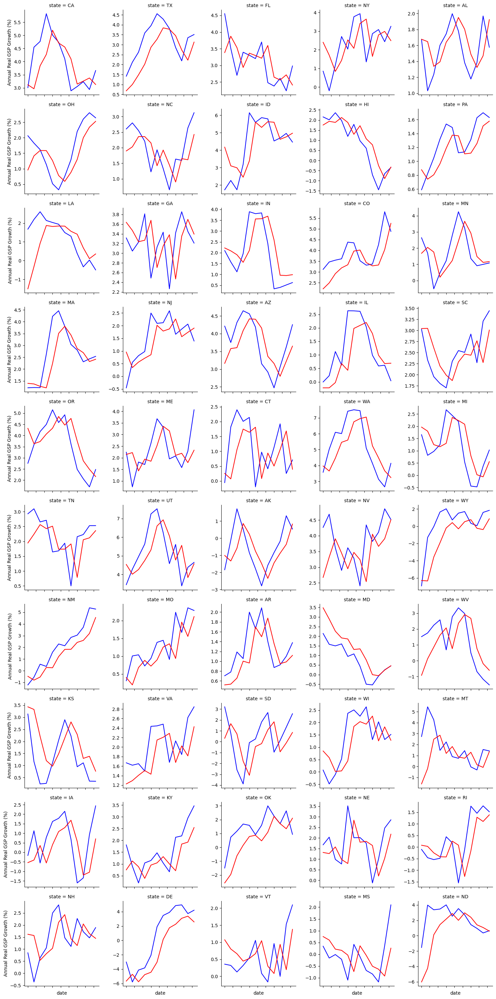

The RMSE for this model is 1.027401889123885


In [176]:
warnings.filterwarnings('ignore')
# run basic autoregression
# BASELINE
# Train: Pseudo-Out-Of-Sample RMSE

reg_data_AR = reg_data[reg_data['year']<2020]
dummies = pd.get_dummies(reg_data_AR['state'])
reg_data_AR = pd.concat([reg_data_AR,dummies],axis=1)

rmse_df_AR = pd.DataFrame()
for dat in reg_data_AR[reg_data_AR['date']>="2017-01-01"]['date'].unique():
    X=sm.add_constant(reg_data_AR[reg_data_AR['date']<dat][reg_data_AR.columns[reg_data_AR.columns.isin(['lag1_rgsp_yoy_pchange']+list(states.keys()))]])
    
    model = sm.OLS(reg_data_AR[reg_data_AR['date']<dat]["rgsp_yoy_pchange"],X)
    results_AR_train = model.fit(cov_type='HC3')
    #print(results2.summary())
    ypred = results_AR_train.predict(sm.add_constant(reg_data_AR[reg_data_AR['date']==dat][reg_data_AR.columns[reg_data_AR.columns.isin(['lag1_rgsp_yoy_pchange']+list(states.keys()))]]))
    actual_gdp = reg_data_AR[reg_data_AR['date']==dat]['rgsp_yoy_pchange']
    state1 = reg_data_AR[reg_data_AR['date']==dat]['state']
    #rmse1 = rmse(actual_gdp, ypred)
    df2 = pd.DataFrame(data={'actual_gdp':actual_gdp,'pred_gdp':ypred,'state':state1,'date':[dat]*len(actual_gdp)})
    rmse_df_AR = rmse_df_AR.append(df2)

# calc rmse
def r2_rmse(g):
    rmse = np.sqrt(mean_squared_error(g['actual_gdp'], g['pred_gdp']))
    return rmse

RMSE_AR = rmse_df_AR.groupby('state').apply(r2_rmse).reset_index().mean()[0]



g = sns.FacetGrid(rmse_df_AR.reset_index(), col="state", col_wrap=5,sharey=False)
g.map(sns.lineplot, "date","actual_gdp",color="blue")
g.map(sns.lineplot, "date","pred_gdp",color='red')
g.set_axis_labels(y_var="Annual Real GSP Growth (%)")
g.set_xticklabels(rotation=45)
plt.show()
g.savefig(charts_folder+"baseline_AR_forecasts.png")

print("The RMSE for this model is "+RMSE_AR.astype(str))

In [34]:
warnings.filterwarnings('ignore')
# run basic autoregression, on recession data
# BASELINE
# Train: Pseudo-Out-Of-Sample RMSE

reg_data_AR = reg_data
dummies = pd.get_dummies(reg_data_AR['state'])
reg_data_AR = pd.concat([reg_data_AR,dummies],axis=1)

rmse_df_AR_test = pd.DataFrame()

X=sm.add_constant(reg_data_AR[reg_data_AR['year']<2020][reg_data_AR.columns[reg_data_AR.columns.isin(['lag1_rgsp_yoy_pchange']+list(states.keys()))]])
    
model = sm.OLS(reg_data_AR[reg_data_AR['year']<2020]["rgsp_yoy_pchange"],X)
results_AR_test = model.fit(cov_type='HC3')
#print(results2.summary())
ypred = results_AR_test.predict(sm.add_constant(reg_data_AR[reg_data_AR['year']>=2020][reg_data_AR.columns[reg_data_AR.columns.isin(['lag1_rgsp_yoy_pchange']+list(states.keys()))]]))
actual_gdp = reg_data_AR[reg_data_AR['year']>=2020]['rgsp_yoy_pchange']
state1 = reg_data_AR[reg_data_AR['year']>=2020]['state']
#rmse1 = rmse(actual_gdp, ypred)
df2 = pd.DataFrame(data={'actual_gdp':actual_gdp,'pred_gdp':ypred,'state':state1,'date':reg_data_AR[reg_data_AR['year']>=2020]['date']})
rmse_df_AR_test = rmse_df_AR_test.append(df2)

# calc rmse
def r2_rmse(g):
    rmse = np.sqrt(mean_squared_error(g['actual_gdp'], g['pred_gdp']))
    return rmse

RMSE_AR_test = rmse_df_AR_test.groupby('state').apply(r2_rmse).reset_index().mean()[0]

print("The RMSE for this model is "+RMSE_AR_test.astype(str))

The RMSE for this model is 5.12832645380077


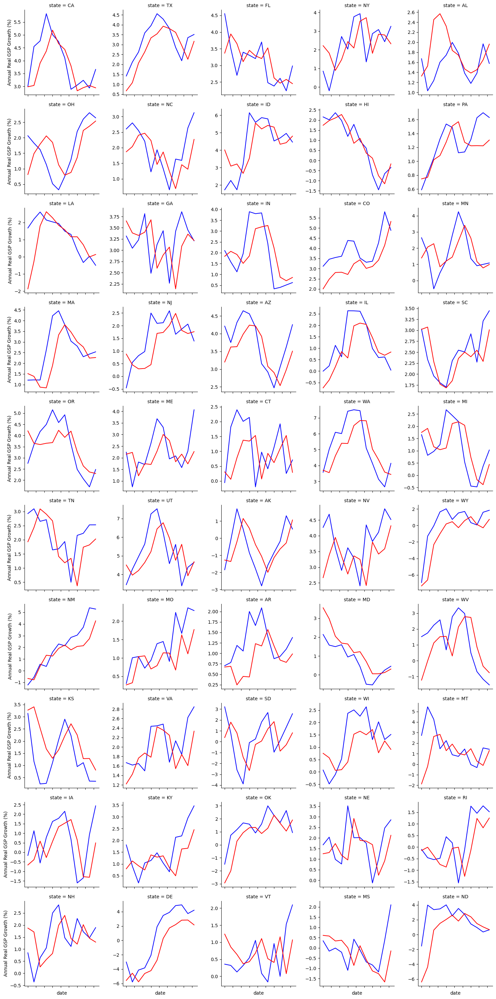

The RMSE for this model is 1.0524611720710453


In [35]:
warnings.filterwarnings('ignore')
# run basic autoregression with economic variables
# BASELINE
# Train: Pseudo-Out-Of-Sample RMSE

reg_data_AR_ECON = reg_data[reg_data['year']<2020]
dummies = pd.get_dummies(reg_data_AR_ECON['state'])
reg_data_AR_ECON = pd.concat([reg_data_AR_ECON,dummies],axis=1)

rmse_df_AR_ECON = pd.DataFrame()
for dat in reg_data_AR_ECON[reg_data_AR_ECON['date']>="2017-01-01"]['date'].unique():
    X=sm.add_constant(reg_data_AR_ECON[reg_data_AR['date']<dat][reg_data_AR_ECON.columns[reg_data_AR_ECON.columns.isin(['lag1_rgsp_yoy_pchange','unemp_rate_yoy_change','lag1_unemp_rate_yoy_change','lfpr_yoy_change','lag1_lfpr_yoy_change']+list(states.keys()))]])
    
    model = sm.OLS(reg_data_AR_ECON[reg_data_AR_ECON['date']<dat]["rgsp_yoy_pchange"],X)
    results_AR_ECON_train = model.fit(cov_type='HC3')
    #print(results2.summary())
    ypred = results_AR_ECON_train.predict(sm.add_constant(reg_data_AR_ECON[reg_data_AR_ECON['date']==dat][reg_data_AR_ECON.columns[reg_data_AR_ECON.columns.isin(['lag1_rgsp_yoy_pchange','unemp_rate_yoy_change','lag1_unemp_rate_yoy_change','lfpr_yoy_change','lag1_lfpr_yoy_change']+list(states.keys()))]]))
    actual_gdp = reg_data_AR_ECON[reg_data_AR_ECON['date']==dat]['rgsp_yoy_pchange']
    state1 = reg_data_AR_ECON[reg_data_AR_ECON['date']==dat]['state']
    #rmse1 = rmse(actual_gdp, ypred)
    df2 = pd.DataFrame(data={'actual_gdp':actual_gdp,'pred_gdp':ypred,'state':state1,'date':[dat]*len(actual_gdp)})
    rmse_df_AR_ECON = rmse_df_AR_ECON.append(df2)

# calc rmse
def r2_rmse(g):
    rmse = np.sqrt(mean_squared_error(g['actual_gdp'], g['pred_gdp']))
    return rmse

RMSE_AR_ECON = rmse_df_AR_ECON.groupby('state').apply(r2_rmse).reset_index().mean()[0]



g = sns.FacetGrid(rmse_df_AR_ECON.reset_index(), col="state", col_wrap=5,sharey=False)
g.map(sns.lineplot, "date","actual_gdp",color="blue")
g.map(sns.lineplot, "date","pred_gdp",color='red')
g.set_axis_labels(y_var="Annual Real GSP Growth (%)")
g.set_xticklabels(rotation=45)
plt.show()
g.savefig(charts_folder+"baseline_AR_ECON_forecasts.png")

print("The RMSE for this model is "+RMSE_AR_ECON.astype(str))

In [36]:
warnings.filterwarnings('ignore')
# run basic autoregression, on recession data
# BASELINE
# Train: Pseudo-Out-Of-Sample RMSE

reg_data_AR_ECON = reg_data
dummies = pd.get_dummies(reg_data_AR_ECON['state'])
reg_data_AR_ECON = pd.concat([reg_data_AR_ECON,dummies],axis=1)

rmse_df_AR_econ_test = pd.DataFrame()

X=sm.add_constant(reg_data_AR_ECON[reg_data_AR_ECON['year']<2020][reg_data_AR_ECON.columns[reg_data_AR_ECON.columns.isin(['lag1_rgsp_yoy_pchange','unemp_rate_yoy_change','lag1_unemp_rate_yoy_change','lfpr_yoy_change','lag1_lfpr_yoy_change']+list(states.keys()))]])
    
model = sm.OLS(reg_data_AR_ECON[reg_data_AR_ECON['year']<2020]["rgsp_yoy_pchange"],X)
results_AR_ECON_test = model.fit(cov_type='HC3')
#print(results2.summary())
ypred = results_AR_ECON_test.predict(sm.add_constant(reg_data_AR_ECON[reg_data_AR_ECON['year']>=2020][reg_data_AR_ECON.columns[reg_data_AR_ECON.columns.isin(['lag1_rgsp_yoy_pchange','unemp_rate_yoy_change','lag1_unemp_rate_yoy_change','lfpr_yoy_change','lag1_lfpr_yoy_change']+list(states.keys()))]]))
actual_gdp = reg_data_AR_ECON[reg_data_AR_ECON['year']>=2020]['rgsp_yoy_pchange']
state1 = reg_data_AR_ECON[reg_data_AR_ECON['year']>=2020]['state']
#rmse1 = rmse(actual_gdp, ypred)
df2 = pd.DataFrame(data={'actual_gdp':actual_gdp,'pred_gdp':ypred,'state':state1,'date':reg_data_AR_ECON[reg_data_AR_ECON['year']>=2020]['date']})
rmse_df_AR_econ_test = rmse_df_AR_econ_test.append(df2)

# calc rmse
def r2_rmse(g):
    rmse = np.sqrt(mean_squared_error(g['actual_gdp'], g['pred_gdp']))
    return rmse

RMSE_AR_ECON_test = rmse_df_AR_econ_test.groupby('state').apply(r2_rmse).reset_index().mean()[0]

print("The RMSE for this model is "+RMSE_AR_ECON_test.astype(str))

The RMSE for this model is 4.52487887614873


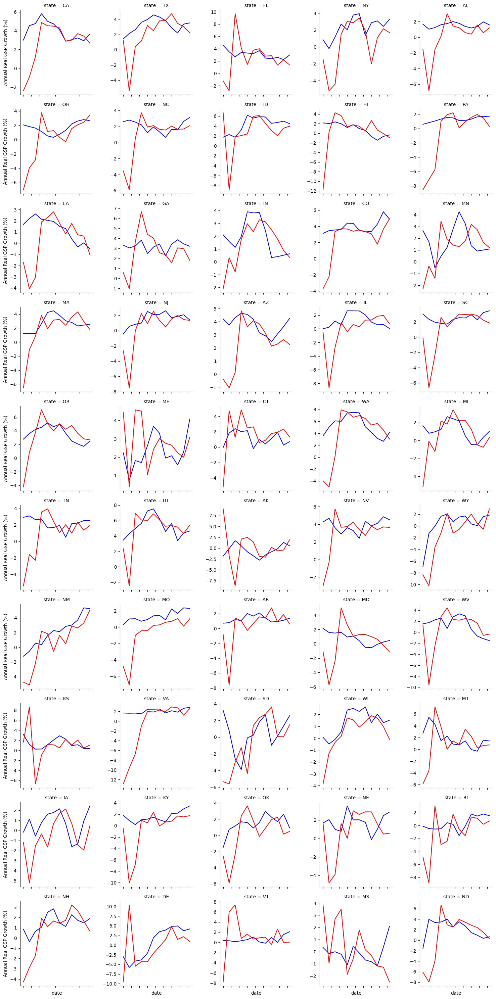

The RMSE for this model is 3.0511204767206026


In [37]:
warnings.filterwarnings('ignore')
# run basic autoregression with economic variables and google trends
# BASELINE
# Train: Pseudo-Out-Of-Sample RMSE

reg_data_AR_ECON_GT = reg_data[reg_data['year']<2020]
dummies = pd.get_dummies(reg_data_AR_ECON_GT['state'])
reg_data_AR_ECON_GT = pd.concat([reg_data_AR_ECON_GT,dummies],axis=1)

rmse_df_AR_ECON_GT = pd.DataFrame()
for dat in reg_data_AR_ECON_GT[reg_data_AR_ECON_GT['date']>="2017-01-01"]['date'].unique():
    X=sm.add_constant(reg_data_AR_ECON_GT[reg_data_AR_ECON_GT['date']<dat][reg_data_AR_ECON_GT.columns[reg_data_AR_ECON_GT.columns.isin(['lag1_rgsp_yoy_pchange','unemp_rate_yoy_change','lag1_unemp_rate_yoy_change','lfpr_yoy_change','lag1_lfpr_yoy_change']+list(trends_sa_wide_pchange_yoy_quarterly.columns[3:len(trends_sa_wide_pchange_yoy_quarterly.columns)])+list(states.keys()))]])
    
    model = sm.OLS(reg_data_AR_ECON_GT[reg_data_AR_ECON_GT['date']<dat]["rgsp_yoy_pchange"],X)
    results_AR_ECON_GT_train = model.fit(cov_type='HC3')
    #print(results2.summary())
    ypred = results_AR_ECON_GT_train.predict(sm.add_constant(reg_data_AR_ECON_GT[reg_data_AR_ECON_GT['date']==dat][reg_data_AR_ECON_GT.columns[reg_data_AR_ECON_GT.columns.isin(['lag1_rgsp_yoy_pchange','unemp_rate_yoy_change','lag1_unemp_rate_yoy_change','lfpr_yoy_change','lag1_lfpr_yoy_change']+list(trends_sa_wide_pchange_yoy_quarterly.columns[3:len(trends_sa_wide_pchange_yoy_quarterly.columns)])+list(states.keys()))]]))
    actual_gdp = reg_data_AR_ECON_GT[reg_data_AR_ECON_GT['date']==dat]['rgsp_yoy_pchange']
    state1 = reg_data_AR_ECON_GT[reg_data_AR_ECON_GT['date']==dat]['state']
    #rmse1 = rmse(actual_gdp, ypred)
    df2 = pd.DataFrame(data={'actual_gdp':actual_gdp,'pred_gdp':ypred,'state':state1,'date':[dat]*len(actual_gdp)})
    rmse_df_AR_ECON_GT = rmse_df_AR_ECON_GT.append(df2)

# calc rmse
def r2_rmse(g):
    rmse = np.sqrt(mean_squared_error(g['actual_gdp'], g['pred_gdp']))
    return rmse

RMSE_AR_ECON_GT = rmse_df_AR_ECON_GT.groupby('state').apply(r2_rmse).reset_index().mean()[0]



g = sns.FacetGrid(rmse_df_AR_ECON_GT.reset_index(), col="state", col_wrap=5,sharey=False)
g.map(sns.lineplot, "date","actual_gdp",color="blue")
g.map(sns.lineplot, "date","pred_gdp",color='red')
g.set_axis_labels(y_var="Annual Real GSP Growth (%)")
g.set_xticklabels(rotation=45)
plt.show()
g.savefig(charts_folder+"baseline_AR_ECON_GT_forecasts.png")

print("The RMSE for this model is "+RMSE_AR_ECON_GT.astype(str))

In [38]:
warnings.filterwarnings('ignore')
# run basic autoregression, on recession data
# BASELINE
# Train: Pseudo-Out-Of-Sample RMSE

reg_data_AR_ECON_GT = reg_data
dummies = pd.get_dummies(reg_data_AR_ECON_GT['state'])
reg_data_AR_ECON_GT = pd.concat([reg_data_AR_ECON_GT,dummies],axis=1)

rmse_df_AR_ECON_GT_test = pd.DataFrame()

X=sm.add_constant(reg_data_AR_ECON_GT[reg_data_AR_ECON_GT['year']<2020][reg_data_AR_ECON_GT.columns[reg_data_AR_ECON_GT.columns.isin(['lag1_rgsp_yoy_pchange','unemp_rate_yoy_change','lag1_unemp_rate_yoy_change','lfpr_yoy_change','lag1_lfpr_yoy_change']+list(trends_sa_wide_pchange_yoy_quarterly.columns[3:len(trends_sa_wide_pchange_yoy_quarterly.columns)])+list(states.keys()))]])
    
model = sm.OLS(reg_data_AR_ECON_GT[reg_data_AR_ECON_GT['year']<2020]["rgsp_yoy_pchange"],X)
results_AR_ECON_GT_test = model.fit(cov_type='HC3')
#print(results2.summary())
ypred = results_AR_ECON_GT_test.predict(sm.add_constant(reg_data_AR_ECON_GT[reg_data_AR_ECON_GT['year']>=2020][reg_data_AR_ECON_GT.columns[reg_data_AR_ECON_GT.columns.isin(['lag1_rgsp_yoy_pchange','unemp_rate_yoy_change','lag1_unemp_rate_yoy_change','lfpr_yoy_change','lag1_lfpr_yoy_change']+list(trends_sa_wide_pchange_yoy_quarterly.columns[3:len(trends_sa_wide_pchange_yoy_quarterly.columns)])+list(states.keys()))]]))
actual_gdp = reg_data_AR_ECON_GT[reg_data_AR_ECON_GT['year']>=2020]['rgsp_yoy_pchange']
state1 = reg_data_AR_ECON_GT[reg_data_AR_ECON_GT['year']>=2020]['state']
#rmse1 = rmse(actual_gdp, ypred)
df2 = pd.DataFrame(data={'actual_gdp':actual_gdp,'pred_gdp':ypred,'state':state1,'date':reg_data_AR_ECON_GT[reg_data_AR_ECON_GT['year']>=2020]['date']})
rmse_df_AR_ECON_GT_test = rmse_df_AR_ECON_GT_test.append(df2)

# calc rmse
def r2_rmse(g):
    rmse = np.sqrt(mean_squared_error(g['actual_gdp'], g['pred_gdp']))
    return rmse

RMSE_AR_ECON_GT_test = rmse_df_AR_ECON_GT_test.groupby('state').apply(r2_rmse).reset_index().mean()[0]

print("The RMSE for this model is "+RMSE_AR_ECON_GT_test.astype(str))

The RMSE for this model is 6.07087210569313


MAE: -0.765
Config: {'alpha': 0.0, 'l1_ratio': 0.0}
MAE: -0.808
Config: {'alpha': 0.001, 'l1_ratio': 0.76}
MAE: -0.889
Config: {'alpha': 0.1, 'l1_ratio': 0.34}
MAE: -0.851
Config: {'alpha': 0.1, 'l1_ratio': 0.4}
MAE: -0.824
Config: {'alpha': 0.1, 'l1_ratio': 0.42}
MAE: -0.842
Config: {'alpha': 0.1, 'l1_ratio': 0.32}
MAE: -0.820
Config: {'alpha': 0.1, 'l1_ratio': 0.29}
MAE: -0.799
Config: {'alpha': 0.1, 'l1_ratio': 0.25}
MAE: -0.794
Config: {'alpha': 0.1, 'l1_ratio': 0.28}
MAE: -0.806
Config: {'alpha': 0.1, 'l1_ratio': 0.31}
MAE: -0.787
Config: {'alpha': 0.1, 'l1_ratio': 0.19}
MAE: -0.783
Config: {'alpha': 0.1, 'l1_ratio': 0.22}


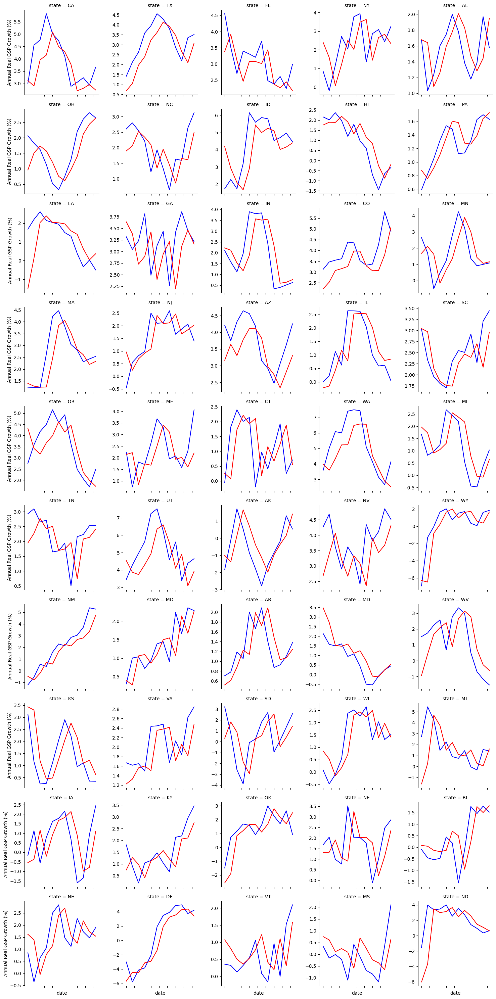

The RMSE for this model is 0.9652656478426931


In [39]:
warnings.filterwarnings('ignore')
# run Elastic Net regression
# Train: Pseudo-Out-Of-Sample RMSE

reg_data_ELNET = reg_data[reg_data['year']<2020]
dummies = pd.get_dummies(reg_data_ELNET['state'])
reg_data_ELNET = pd.concat([reg_data_ELNET,dummies],axis=1)

rmse_df_ELNET = pd.DataFrame()
for dat in reg_data_ELNET[reg_data_ELNET['date']>="2017-01-01"]['date'].unique():
    X=sm.add_constant(reg_data_ELNET[reg_data_ELNET['date']<dat][reg_data_ELNET.columns[reg_data_ELNET.columns.isin(['lag1_rgsp_yoy_pchange']+list(states.keys()))]])
    
    model = ElasticNet()
    # define model evaluation method
    cv = RepeatedKFold(n_splits=5, n_repeats=3, random_state=1)
    # define grid
    grid = dict()
    grid['alpha'] = [1e-5, 1e-4, 1e-3, 1e-2, 1e-1, 0.0, 1.0, 10.0, 100.0]
    grid['l1_ratio'] = np.arange(0, 1, 0.01)
    # define search
    search = GridSearchCV(model, grid, scoring='neg_mean_absolute_error', cv=cv, n_jobs=-1)
    # perform the search
    results_ELNET_train = search.fit(X, reg_data_ELNET[reg_data_ELNET['date']<dat]["rgsp_yoy_pchange"])
    # summarize
    print('MAE: %.3f' % results_ELNET_train.best_score_)
    print('Config: %s' % results_ELNET_train.best_params_)

    results_ELNET_train = ElasticNet(**results_ELNET_train.best_params_).fit(X,reg_data_ELNET[reg_data_ELNET['date']<dat]["rgsp_yoy_pchange"])

    #print(results2.summary())
    ypred = results_ELNET_train.predict(sm.add_constant(reg_data_ELNET[reg_data_ELNET['date']==dat][reg_data_ELNET.columns[reg_data_ELNET.columns.isin(['lag1_rgsp_yoy_pchange']+list(states.keys()))]]))
    actual_gdp = reg_data_ELNET[reg_data_ELNET['date']==dat]['rgsp_yoy_pchange']
    state1 = reg_data_ELNET[reg_data_ELNET['date']==dat]['state']
    #rmse1 = rmse(actual_gdp, ypred)
    df2 = pd.DataFrame(data={'actual_gdp':actual_gdp,'pred_gdp':ypred,'state':state1,'date':[dat]*len(actual_gdp)})
    rmse_df_ELNET = rmse_df_ELNET.append(df2)

# calc rmse
def r2_rmse(g):
    rmse = np.sqrt(mean_squared_error(g['actual_gdp'], g['pred_gdp']))
    return rmse

RMSE_ELNET = rmse_df_ELNET.groupby('state').apply(r2_rmse).reset_index().mean()[0]



g = sns.FacetGrid(rmse_df_ELNET.reset_index(), col="state", col_wrap=5,sharey=False)
g.map(sns.lineplot, "date","actual_gdp",color="blue")
g.map(sns.lineplot, "date","pred_gdp",color='red')
g.set_axis_labels(y_var="Annual Real GSP Growth (%)")
g.set_xticklabels(rotation=45)
plt.show()
g.savefig(charts_folder+"baseline_ELNET_forecasts.png")

print("The RMSE for this model is "+RMSE_ELNET.astype(str))

In [40]:
warnings.filterwarnings('ignore')
# run basic autoregression, on recession data
# BASELINE
# Train: Pseudo-Out-Of-Sample RMSE

reg_data_ELNET = reg_data
dummies = pd.get_dummies(reg_data_ELNET['state'])
reg_data_ELNET = pd.concat([reg_data_ELNET,dummies],axis=1)

rmse_df_ELNET_test = pd.DataFrame()

X=sm.add_constant(reg_data_ELNET[reg_data_ELNET['year']<2020][reg_data_ELNET.columns[reg_data_ELNET.columns.isin(['lag1_rgsp_yoy_pchange']+list(states.keys()))]])
    
model = ElasticNet()
# define model evaluation method
cv = RepeatedKFold(n_splits=5, n_repeats=3, random_state=1)
# define grid
grid = dict()
grid['alpha'] = [1e-5, 1e-4, 1e-3, 1e-2, 1e-1, 0.0, 1.0, 10.0, 100.0]
grid['l1_ratio'] = np.arange(0, 1, 0.01)
# define search
search = GridSearchCV(model, grid, scoring='neg_mean_absolute_error', cv=cv, n_jobs=-1)
# perform the search
results_ELNET_test = search.fit(X, reg_data_ELNET[reg_data_ELNET['year']<2020]["rgsp_yoy_pchange"])
# summarize
print('MAE: %.3f' % results_ELNET_test.best_score_)
print('Config: %s' % results_ELNET_test.best_params_)

results_ELNET_test = ElasticNet(**results_ELNET_test.best_params_).fit(X,reg_data_ELNET[reg_data_ELNET['year']<2020]["rgsp_yoy_pchange"])

#print(results2.summary())
ypred = results_ELNET_test.predict(sm.add_constant(reg_data_ELNET[reg_data_ELNET['year']>=2020][reg_data_ELNET.columns[reg_data_ELNET.columns.isin(['lag1_rgsp_yoy_pchange']+list(states.keys()))]]))
actual_gdp = reg_data_ELNET[reg_data_ELNET['year']>=2020]['rgsp_yoy_pchange']
state1 = reg_data_ELNET[reg_data_ELNET['year']>=2020]['state']
#rmse1 = rmse(actual_gdp, ypred)
df2 = pd.DataFrame(data={'actual_gdp':actual_gdp,'pred_gdp':ypred,'state':state1,'date':reg_data_ELNET[reg_data_ELNET['year']>=2020]['date']})
rmse_df_ELNET_test = rmse_df_ELNET_test.append(df2)

# calc rmse
def r2_rmse(g):
    rmse = np.sqrt(mean_squared_error(g['actual_gdp'], g['pred_gdp']))
    return rmse

RMSE_ELNET_test = rmse_df_ELNET_test.groupby('state').apply(r2_rmse).reset_index().mean()[0]

print("The RMSE for this model is "+RMSE_ELNET_test.astype(str))

MAE: -0.766
Config: {'alpha': 0.1, 'l1_ratio': 0.2}
The RMSE for this model is 5.315726282781201


MAE: -0.787
Config: {'alpha': 0.0001, 'l1_ratio': 0.0}
MAE: -0.829
Config: {'alpha': 0.001, 'l1_ratio': 0.79}
MAE: -0.889
Config: {'alpha': 0.1, 'l1_ratio': 0.6900000000000001}
MAE: -0.848
Config: {'alpha': 0.1, 'l1_ratio': 0.61}
MAE: -0.824
Config: {'alpha': 0.1, 'l1_ratio': 0.56}
MAE: -0.842
Config: {'alpha': 0.1, 'l1_ratio': 0.56}
MAE: -0.821
Config: {'alpha': 0.1, 'l1_ratio': 0.97}
MAE: -0.798
Config: {'alpha': 0.1, 'l1_ratio': 0.5}
MAE: -0.792
Config: {'alpha': 0.1, 'l1_ratio': 0.49}
MAE: -0.800
Config: {'alpha': 0.1, 'l1_ratio': 0.32}
MAE: -0.783
Config: {'alpha': 0.1, 'l1_ratio': 0.17}
MAE: -0.782
Config: {'alpha': 0.1, 'l1_ratio': 0.36}


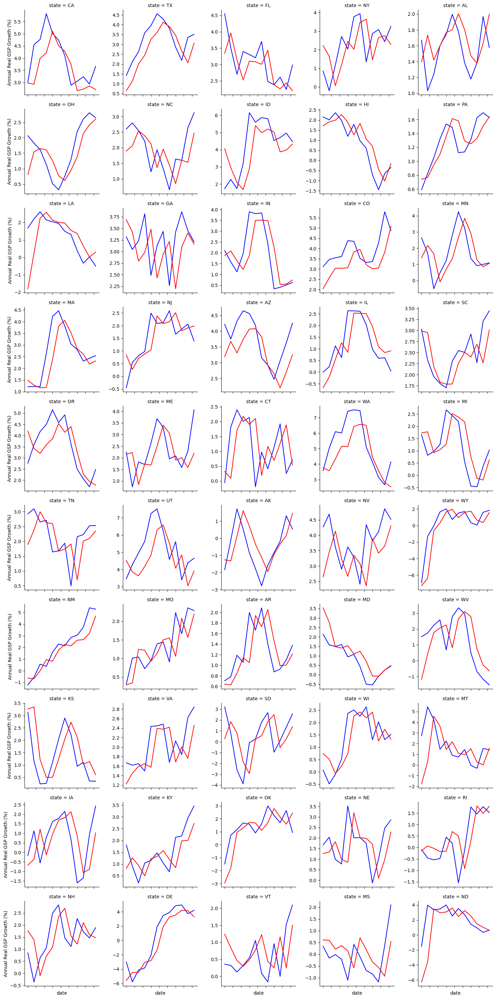

The RMSE for this model is 0.970669617864508


In [41]:
warnings.filterwarnings('ignore')
# run Elastic Net regression, with economic variables
# Train: Pseudo-Out-Of-Sample RMSE

reg_data_ELNET_ECON = reg_data[reg_data['year']<2020]
dummies = pd.get_dummies(reg_data_ELNET_ECON['state'])
reg_data_ELNET_ECON = pd.concat([reg_data_ELNET_ECON,dummies],axis=1)

rmse_df_ELNET_ECON = pd.DataFrame()
for dat in reg_data_ELNET_ECON[reg_data_ELNET_ECON['date']>="2017-01-01"]['date'].unique():
    X=sm.add_constant(reg_data_ELNET_ECON[reg_data_ELNET_ECON['date']<dat][reg_data_ELNET_ECON.columns[reg_data_ELNET_ECON.columns.isin(['lag1_rgsp_yoy_pchange','unemp_rate_yoy_change','lag1_unemp_rate_yoy_change','lfpr_yoy_change','lag1_lfpr_yoy_change']+list(states.keys()))]])
    
    model = ElasticNet()
    # define model evaluation method
    cv = RepeatedKFold(n_splits=5, n_repeats=3, random_state=1)
    # define grid
    grid = dict()
    grid['alpha'] = [1e-5, 1e-4, 1e-3, 1e-2, 1e-1, 0.0, 1.0, 10.0, 100.0]
    grid['l1_ratio'] = np.arange(0, 1, 0.01)
    # define search
    search = GridSearchCV(model, grid, scoring='neg_mean_absolute_error', cv=cv, n_jobs=-1)
    # perform the search
    results_ELNET_ECON_train = search.fit(X, reg_data_ELNET_ECON[reg_data_ELNET_ECON['date']<dat]["rgsp_yoy_pchange"])
    # summarize
    print('MAE: %.3f' % results_ELNET_ECON_train.best_score_)
    print('Config: %s' % results_ELNET_ECON_train.best_params_)

    results_ELNET_ECON_train = ElasticNet(**results_ELNET_ECON_train.best_params_).fit(X,reg_data_ELNET_ECON[reg_data_ELNET_ECON['date']<dat]["rgsp_yoy_pchange"])

    #print(results2.summary())
    ypred = results_ELNET_ECON_train.predict(sm.add_constant(reg_data_ELNET_ECON[reg_data_ELNET_ECON['date']==dat][reg_data_ELNET_ECON.columns[reg_data_ELNET_ECON.columns.isin(['lag1_rgsp_yoy_pchange','unemp_rate_yoy_change','lag1_unemp_rate_yoy_change','lfpr_yoy_change','lag1_lfpr_yoy_change']+list(states.keys()))]]))
    actual_gdp = reg_data_ELNET_ECON[reg_data_ELNET_ECON['date']==dat]['rgsp_yoy_pchange']
    state1 = reg_data_ELNET_ECON[reg_data_ELNET_ECON['date']==dat]['state']
    #rmse1 = rmse(actual_gdp, ypred)
    df2 = pd.DataFrame(data={'actual_gdp':actual_gdp,'pred_gdp':ypred,'state':state1,'date':[dat]*len(actual_gdp)})
    rmse_df_ELNET_ECON = rmse_df_ELNET_ECON.append(df2)

# calc rmse
def r2_rmse(g):
    rmse = np.sqrt(mean_squared_error(g['actual_gdp'], g['pred_gdp']))
    return rmse

RMSE_ELNET_ECON = rmse_df_ELNET_ECON.groupby('state').apply(r2_rmse).reset_index().mean()[0]



g = sns.FacetGrid(rmse_df_ELNET_ECON.reset_index(), col="state", col_wrap=5,sharey=False)
g.map(sns.lineplot, "date","actual_gdp",color="blue")
g.map(sns.lineplot, "date","pred_gdp",color='red')
g.set_axis_labels(y_var="Annual Real GSP Growth (%)")
g.set_xticklabels(rotation=45)
plt.show()
g.savefig(charts_folder+"baseline_ELNET_ECON_forecasts.png")

print("The RMSE for this model is "+RMSE_ELNET_ECON.astype(str))

In [42]:
warnings.filterwarnings('ignore')
# run basic autoregression, on recession data
# BASELINE
# Train: Pseudo-Out-Of-Sample RMSE

reg_data_ELNET_ECON = reg_data
dummies = pd.get_dummies(reg_data_ELNET_ECON['state'])
reg_data_ELNET_ECON = pd.concat([reg_data_ELNET_ECON,dummies],axis=1)

rmse_df_ELNET_ECON_test = pd.DataFrame()

X=sm.add_constant(reg_data_ELNET_ECON[reg_data_ELNET_ECON['year']<2020][reg_data_ELNET_ECON.columns[reg_data_ELNET_ECON.columns.isin(['lag1_rgsp_yoy_pchange','unemp_rate_yoy_change','lag1_unemp_rate_yoy_change','lfpr_yoy_change','lag1_lfpr_yoy_change']+list(states.keys()))]])
    
model = ElasticNet()
# define model evaluation method
cv = RepeatedKFold(n_splits=5, n_repeats=3, random_state=1)
# define grid
grid = dict()
grid['alpha'] = [1e-5, 1e-4, 1e-3, 1e-2, 1e-1, 0.0, 1.0, 10.0, 100.0]
grid['l1_ratio'] = np.arange(0, 1, 0.01)
# define search
search = GridSearchCV(model, grid, scoring='neg_mean_absolute_error', cv=cv, n_jobs=-1)
# perform the search
results_ELNET_ECON_test = search.fit(X, reg_data_ELNET_ECON[reg_data_ELNET_ECON['year']<2020]["rgsp_yoy_pchange"])
# summarize
print('MAE: %.3f' % results_ELNET_ECON_test.best_score_)
print('Config: %s' % results_ELNET_ECON_test.best_params_)

results_ELNET_ECON_test = ElasticNet(**results_ELNET_ECON_test.best_params_).fit(X,reg_data_ELNET_ECON[reg_data_ELNET_ECON['year']<2020]["rgsp_yoy_pchange"])

#print(results2.summary())
ypred = results_ELNET_ECON_test.predict(sm.add_constant(reg_data_ELNET_ECON[reg_data_ELNET_ECON['year']>=2020][reg_data_ELNET_ECON.columns[reg_data_ELNET_ECON.columns.isin(['lag1_rgsp_yoy_pchange','unemp_rate_yoy_change','lag1_unemp_rate_yoy_change','lfpr_yoy_change','lag1_lfpr_yoy_change']+list(states.keys()))]]))
actual_gdp = reg_data_ELNET_ECON[reg_data_ELNET_ECON['year']>=2020]['rgsp_yoy_pchange']
state1 = reg_data_ELNET_ECON[reg_data_ELNET_ECON['year']>=2020]['state']
#rmse1 = rmse(actual_gdp, ypred)
df2 = pd.DataFrame(data={'actual_gdp':actual_gdp,'pred_gdp':ypred,'state':state1,'date':reg_data_ELNET_ECON[reg_data_ELNET_ECON['year']>=2020]['date']})
rmse_df_ELNET_ECON_test = rmse_df_ELNET_ECON_test.append(df2)

# calc rmse
def r2_rmse(g):
    rmse = np.sqrt(mean_squared_error(g['actual_gdp'], g['pred_gdp']))
    return rmse

RMSE_ELNET_ECON_test = rmse_df_ELNET_ECON_test.groupby('state').apply(r2_rmse).reset_index().mean()[0]

print("The RMSE for this model is "+RMSE_ELNET_ECON_test.astype(str))

MAE: -0.765
Config: {'alpha': 0.1, 'l1_ratio': 0.17}
The RMSE for this model is 5.091742718649238


Unable to restore variable 'clf_NN', ignoring (use %store -d to forget!)
The error was: <class 'KeyError'>
Unable to restore variable 'model_LSTM', ignoring (use %store -d to forget!)
The error was: <class 'KeyError'>


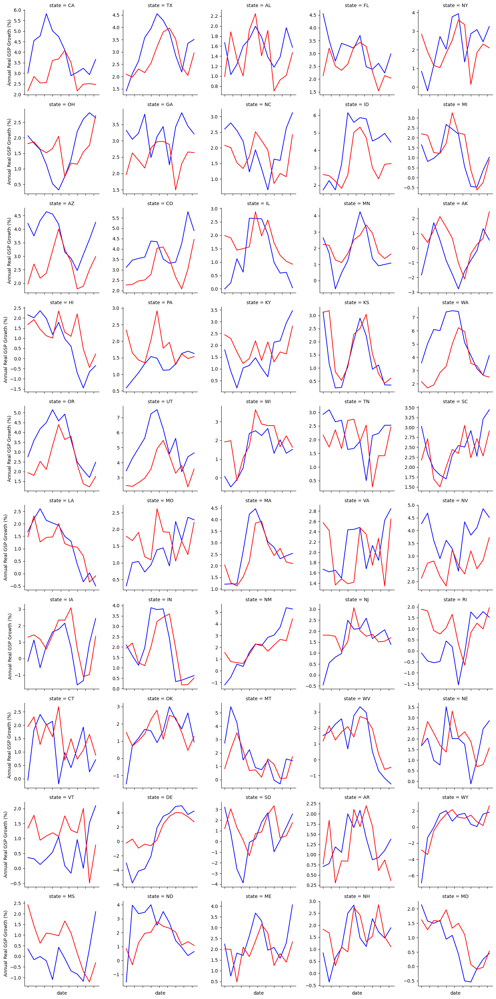

The RMSE for this model is 1.1822610691311268


In [43]:
#warnings.filterwarnings('ignore')
# run Elastic Net regression, with economic variables and Google Trends
# Train: Pseudo-Out-Of-Sample RMSE

#reg_data_ELNET_ECON_GT = reg_data[reg_data['year']<2020]
#dummies = pd.get_dummies(reg_data_ELNET_ECON_GT['state'])
#reg_data_ELNET_ECON_GT = pd.concat([reg_data_ELNET_ECON_GT,dummies],axis=1)

#rmse_df_ELNET_ECON_GT = pd.DataFrame()
#for dat in reg_data_ELNET_ECON_GT[reg_data_ELNET_ECON_GT['date']>="2017-01-01"]['date'].unique():
#    X=sm.add_constant(reg_data_ELNET_ECON_GT[reg_data_ELNET_ECON_GT['date']<dat][reg_data_ELNET_ECON_GT.columns[reg_data_ELNET_ECON_GT.columns.isin(['lag1_rgsp_yoy_pchange','unemp_rate_yoy_change','lag1_unemp_rate_yoy_change','lfpr_yoy_change','lag1_lfpr_yoy_change']+list(trends_sa_wide_pchange_yoy_quarterly.columns[3:len(trends_sa_wide_pchange_yoy_quarterly.columns)])+list(states.keys()))]])
#    
#    model = ElasticNet()
#    # define model evaluation method
#    cv = RepeatedKFold(n_splits=5, n_repeats=3, random_state=1)
#    # define grid
#    grid = dict()
#    grid['alpha'] = [1e-5, 1e-4, 1e-3, 1e-2, 1e-1, 0.0, 1.0, 10.0, 100.0]
#    grid['l1_ratio'] = np.arange(0, 1, 0.1)
    # define search
#    search = GridSearchCV(model, grid, scoring='neg_mean_absolute_error', cv=cv, n_jobs=-1)
    # perform the search
#    results_ELNET_ECON_GT_train = search.fit(X, reg_data_ELNET_ECON_GT[reg_data_ELNET_ECON_GT['date']<dat]["rgsp_yoy_pchange"])
    # summarize
#    print('MAE: %.3f' % results_ELNET_ECON_GT_train.best_score_)
#    print('Config: %s' % results_ELNET_ECON_GT_train.best_params_)

#    results_ELNET_ECON_GT_train = ElasticNet(**results_ELNET_ECON_GT_train.best_params_).fit(X,reg_data_ELNET_ECON_GT[reg_data_ELNET_ECON_GT['date']<dat]["rgsp_yoy_pchange"])

    #print(results2.summary())
#    ypred = results_ELNET_ECON_GT_train.predict(sm.add_constant(reg_data_ELNET_ECON_GT[reg_data_ELNET_ECON_GT['date']==dat][reg_data_ELNET_ECON_GT.columns[reg_data_ELNET_ECON_GT.columns.isin(['lag1_rgsp_yoy_pchange','unemp_rate_yoy_change','lag1_unemp_rate_yoy_change','lfpr_yoy_change','lag1_lfpr_yoy_change']+list(trends_sa_wide_pchange_yoy_quarterly.columns[3:len(trends_sa_wide_pchange_yoy_quarterly.columns)])+list(states.keys()))]]))
#    actual_gdp = reg_data_ELNET_ECON_GT[reg_data_ELNET_ECON_GT['date']==dat]['rgsp_yoy_pchange']
#    state1 = reg_data_ELNET_ECON_GT[reg_data_ELNET_ECON_GT['date']==dat]['state']
    #rmse1 = rmse(actual_gdp, ypred)
#    df2 = pd.DataFrame(data={'actual_gdp':actual_gdp,'pred_gdp':ypred,'state':state1,'date':[dat]*len(actual_gdp)})
#    rmse_df_ELNET_ECON_GT = rmse_df_ELNET_ECON_GT.append(df2)

# calc rmse
#def r2_rmse(g):
#   rmse = np.sqrt(mean_squared_error(g['actual_gdp'], g['pred_gdp']))
#    return rmse

%store -r

RMSE_ELNET_ECON_GT = rmse_df_ELNET_ECON_GT.groupby('state').apply(r2_rmse).reset_index().mean()[0]

g = sns.FacetGrid(rmse_df_ELNET_ECON_GT.reset_index(), col="state", col_wrap=5,sharey=False)
g.map(sns.lineplot, "date","actual_gdp",color="blue")
g.map(sns.lineplot, "date","pred_gdp",color='red')
g.set_axis_labels(y_var="Annual Real GSP Growth (%)")
g.set_xticklabels(rotation=45)
plt.show()
g.savefig(charts_folder+"baseline_ELNET_ECON_GT_forecasts.png")

print("The RMSE for this model is "+RMSE_ELNET_ECON_GT.astype(str))

#%store rmse_df_ELNET_ECON_GT 

In [44]:
warnings.filterwarnings('ignore')
# run basic autoregression, on recession data and google trends
# BASELINE
# Train: Pseudo-Out-Of-Sample RMSE

reg_data_ELNET_ECON_GT = reg_data
dummies = pd.get_dummies(reg_data_ELNET_ECON_GT['state'])
reg_data_ELNET_ECON_GT = pd.concat([reg_data_ELNET_ECON_GT,dummies],axis=1)

rmse_df_ELNET_ECON_GT_test = pd.DataFrame()

X=sm.add_constant(reg_data_ELNET_ECON_GT[reg_data_ELNET_ECON_GT['year']<2020][reg_data_ELNET_ECON_GT.columns[reg_data_ELNET_ECON_GT.columns.isin(['lag1_rgsp_yoy_pchange','unemp_rate_yoy_change','lag1_unemp_rate_yoy_change','lfpr_yoy_change','lag1_lfpr_yoy_change']+list(trends_sa_wide_pchange_yoy_quarterly.columns[3:len(trends_sa_wide_pchange_yoy_quarterly.columns)])+list(states.keys()))]])
    
model = ElasticNet()
# define model evaluation method
cv = RepeatedKFold(n_splits=5, n_repeats=3, random_state=1)
# define grid
grid = dict()
grid['alpha'] = [1e-5, 1e-4, 1e-3, 1e-2, 1e-1, 0.0, 1.0, 10.0, 100.0]
grid['l1_ratio'] = np.arange(0, 1, 0.1)
# define search
search = GridSearchCV(model, grid, scoring='neg_mean_absolute_error', cv=cv, n_jobs=-1)
# perform the search
results_ELNET_ECON_GT_test = search.fit(X, reg_data_ELNET_ECON_GT[reg_data_ELNET_ECON_GT['year']<2020]["rgsp_yoy_pchange"])
# summarize
print('MAE: %.3f' % results_ELNET_ECON_GT_test.best_score_)
print('Config: %s' % results_ELNET_ECON_GT_test.best_params_)

results_ELNET_ECON_GT_test = ElasticNet(**results_ELNET_ECON_GT_test.best_params_).fit(X,reg_data_ELNET_ECON_GT[reg_data_ELNET_ECON_GT['year']<2020]["rgsp_yoy_pchange"])

#print(results2.summary())
ypred = results_ELNET_ECON_GT_test.predict(sm.add_constant(reg_data_ELNET_ECON_GT[reg_data_ELNET_ECON_GT['year']>=2020][reg_data_ELNET_ECON_GT.columns[reg_data_ELNET_ECON_GT.columns.isin(['lag1_rgsp_yoy_pchange','unemp_rate_yoy_change','lag1_unemp_rate_yoy_change','lfpr_yoy_change','lag1_lfpr_yoy_change']+list(trends_sa_wide_pchange_yoy_quarterly.columns[3:len(trends_sa_wide_pchange_yoy_quarterly.columns)])+list(states.keys()))]]))
actual_gdp = reg_data_ELNET_ECON_GT[reg_data_ELNET_ECON_GT['year']>=2020]['rgsp_yoy_pchange']
state1 = reg_data_ELNET_ECON_GT[reg_data_ELNET_ECON_GT['year']>=2020]['state']
#rmse1 = rmse(actual_gdp, ypred)
df2 = pd.DataFrame(data={'actual_gdp':actual_gdp,'pred_gdp':ypred,'state':state1,'date':reg_data_ELNET_ECON_GT[reg_data_ELNET_ECON_GT['year']>=2020]['date']})
rmse_df_ELNET_ECON_GT_test = rmse_df_ELNET_ECON_GT_test.append(df2)

# calc rmse
def r2_rmse(g):
    rmse = np.sqrt(mean_squared_error(g['actual_gdp'], g['pred_gdp']))
    return rmse

RMSE_ELNET_ECON_GT_test = rmse_df_ELNET_ECON_GT_test.groupby('state').apply(r2_rmse).reset_index().mean()[0]

print("The RMSE for this model is "+RMSE_ELNET_ECON_GT_test.astype(str))

MAE: -0.819
Config: {'alpha': 0.1, 'l1_ratio': 0.9}
The RMSE for this model is 5.614117064845227


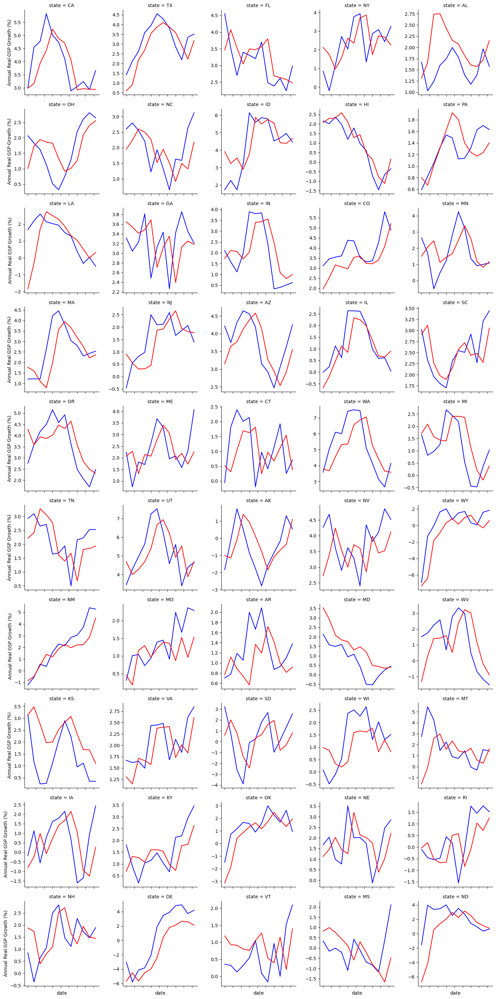

The RMSE for this model is 1.0549503944162846


In [45]:
warnings.filterwarnings('ignore')
# run Dynamic Factor Model regression, with economic variables and Google Trends
# Train: Pseudo-Out-Of-Sample RMSE

reg_data_DFM = reg_data[reg_data['year']<2020]
dummies = pd.get_dummies(reg_data_DFM['state'])
reg_data_DFM = pd.concat([reg_data_DFM,dummies],axis=1)

rmse_df_DFM = pd.DataFrame()
for dat in reg_data_DFM[reg_data_DFM['date']>="2017-01-01"]['date'].unique():
    
    X_pca=reg_data_DFM[reg_data_DFM.columns[reg_data_DFM.columns.isin(['state','date']+list(trends_sa_wide_pchange_yoy_quarterly.columns[3:len(trends_sa_wide_pchange_yoy_quarterly.columns)]))]]
  
    pca = PCA(n_components = 7)
    
    X_pca_data = pd.DataFrame()
    for stat in X_pca['state'].unique():
        df = pd.DataFrame(pca.fit_transform(X_pca.loc[X_pca['state']==stat].drop(['state','date'],axis=1))).rename(columns={0:'factor1',1:'factor2',2:'factor3',3:'factor4',4:'factor5',5:'factor6',6:'factor7',7:'factor8',8:'factor9',9:'factor10'})
        df['state'] = stat
        df['date'] = X_pca.loc[X_pca['state']==stat]['date'].reset_index(drop=True)
        X_pca_data = X_pca_data.append(df)
    X_join = reg_data_DFM[reg_data_DFM['date']<dat][reg_data_DFM.columns[reg_data_DFM.columns.isin(['state','date','lag1_rgsp_yoy_pchange','unemp_rate_yoy_change','lag1_unemp_rate_yoy_change','lfpr_yoy_change','lag1_lfpr_yoy_change']+list(states.keys()))]]
    X_join.reset_index(drop=True, inplace=True)
    X_pca_data_train = X_pca_data[X_pca_data['date']<dat]
    X_pca_data_train.reset_index(drop=True, inplace=True)
    X = X_join.merge(X_pca_data_train,left_on=['state','date'],right_on=['state','date'], how='left')
    X = X.drop(['state','date'],axis=1)

    X=sm.add_constant(X)
    y = reg_data_DFM[reg_data_DFM['date']<dat]["rgsp_yoy_pchange"]
    y.reset_index(drop=True, inplace=True)
    model = sm.OLS(y,X)
    results_DFM_train = model.fit(cov_type='HC3')
    #print(results2.summary())
    X_join = reg_data_DFM[reg_data_DFM['date']==dat][reg_data_DFM.columns[reg_data_DFM.columns.isin(['state','date','lag1_rgsp_yoy_pchange','unemp_rate_yoy_change','lag1_unemp_rate_yoy_change','lfpr_yoy_change','lag1_lfpr_yoy_change']+list(states.keys()))]]
    X_join.reset_index(drop=True, inplace=True)
    X_pca_data_train = X_pca_data[X_pca_data['date']==dat]
    X_pca_data_train.reset_index(drop=True, inplace=True)
    X = X_join.merge(X_pca_data_train,left_on=['state','date'],right_on=['state','date'], how='left')
    X = X.drop(['state','date'],axis=1)
    ypred = results_DFM_train.predict(sm.add_constant(X))
    actual_gdp = reg_data_DFM[reg_data_DFM['date']==dat]['rgsp_yoy_pchange']
    state1 = reg_data_DFM[reg_data_DFM['date']==dat]['state']
    actual_gdp.reset_index(drop=True, inplace=True)
    state1.reset_index(drop=True, inplace=True)
    ypred.reset_index(drop=True, inplace=True)
    #rmse1 = rmse(actual_gdp, ypred)
    df2 = pd.DataFrame(data={'actual_gdp':actual_gdp,'pred_gdp':ypred,'state':state1,'date':[dat]*len(actual_gdp)})
    rmse_df_DFM = rmse_df_DFM.append(df2)

# calc rmse
def r2_rmse(g):
    rmse = np.sqrt(mean_squared_error(g['actual_gdp'], g['pred_gdp']))
    return rmse

RMSE_DFM = rmse_df_DFM.groupby('state').apply(r2_rmse).reset_index().mean()[0]



g = sns.FacetGrid(rmse_df_DFM.reset_index(), col="state", col_wrap=5,sharey=False)
g.map(sns.lineplot, "date","actual_gdp",color="blue")
g.map(sns.lineplot, "date","pred_gdp",color='red')
g.set_axis_labels(y_var="Annual Real GSP Growth (%)")
g.set_xticklabels(rotation=45)
plt.show()
g.savefig(charts_folder+"baseline_DFM_forecasts.png")

print("The RMSE for this model is "+RMSE_DFM.astype(str))

In [46]:
warnings.filterwarnings('ignore')
# run basic autoregression, on recession data
# BASELINE
# Train: Pseudo-Out-Of-Sample RMSE

reg_data_DFM = reg_data
dummies = pd.get_dummies(reg_data_DFM['state'])
reg_data_DFM = pd.concat([reg_data_DFM,dummies],axis=1)

rmse_df_DFM_test = pd.DataFrame()

X_pca=reg_data_DFM.loc[:,reg_data_DFM.columns.isin(['state','year','date']+list(trends_sa_wide_pchange_yoy_quarterly.columns[3:len(trends_sa_wide_pchange_yoy_quarterly.columns)]))]
  
pca = PCA(n_components = 7)
    
X_pca_data = pd.DataFrame()
for stat in X_pca['state'].unique():
    df = pd.DataFrame(pca.fit_transform(X_pca[(X_pca['state']==stat)].drop(['state','year','date'],axis=1))).rename(columns={0:'factor1',1:'factor2',2:'factor3',3:'factor4',4:'factor5',5:'factor6',6:'factor7',7:'factor8',8:'factor9',9:'factor10'})
    df['state'] = stat
    df['year'] = X_pca.loc[X_pca['state']==stat]['year'].reset_index(drop=True)
    df['date'] = X_pca.loc[X_pca['state']==stat]['date'].reset_index(drop=True)
    X_pca_data = X_pca_data.append(df)
X_join = reg_data_DFM[reg_data_DFM['year']<2020][reg_data_DFM.columns[reg_data_DFM.columns.isin(['state','year','date','lag1_rgsp_yoy_pchange','unemp_rate_yoy_change','lag1_unemp_rate_yoy_change','lfpr_yoy_change','lag1_lfpr_yoy_change']+list(states.keys()))]]
X_join.reset_index(drop=True, inplace=True)
X_pca_data_train = X_pca_data[X_pca_data['year']<2020]
X_pca_data_train.reset_index(drop=True, inplace=True)
X = X_join.merge(X_pca_data_train,left_on=['state','date','year'],right_on=['state','date','year'], how='left')
X = X.drop(['state','date','year'],axis=1)

X=sm.add_constant(X)
y = reg_data_DFM[reg_data_DFM['year']<2020]["rgsp_yoy_pchange"]
y.reset_index(drop=True, inplace=True)
model = sm.OLS(y,X)
results_DFM_train = model.fit(cov_type='HC3')
#print(results2.summary())
X_join = reg_data_DFM[reg_data_DFM['year']>=2020][reg_data_DFM.columns[reg_data_DFM.columns.isin(['state','year','date','lag1_rgsp_yoy_pchange','unemp_rate_yoy_change','lag1_unemp_rate_yoy_change','lfpr_yoy_change','lag1_lfpr_yoy_change']+list(states.keys()))]]
X_join.reset_index(drop=True, inplace=True)
X_pca_data_train = X_pca_data[X_pca_data['year']>=2020]
X_pca_data_train.reset_index(drop=True, inplace=True)
X = X_join.merge(X_pca_data_train,left_on=['state','date','year'],right_on=['state','date','year'], how='left')
X = X.drop(['state','date','year'],axis=1)
ypred = results_DFM_train.predict(sm.add_constant(X))
actual_gdp = reg_data_DFM[reg_data_DFM['year']>=2020]['rgsp_yoy_pchange']
state1 = reg_data_DFM[reg_data_DFM['year']>=2020]['state']
date1 = reg_data_DFM[reg_data_DFM['year']>=2020]['date']
actual_gdp.reset_index(drop=True, inplace=True)
state1.reset_index(drop=True, inplace=True)
ypred.reset_index(drop=True, inplace=True)
date1.reset_index(drop=True, inplace=True)
#rmse1 = rmse(actual_gdp, ypred)
df2 = pd.DataFrame(data={'actual_gdp':actual_gdp,'pred_gdp':ypred,'state':state1,'date':date1})
rmse_df_DFM_test = rmse_df_DFM_test.append(df2)

# calc rmse
def r2_rmse(g):
    rmse = np.sqrt(mean_squared_error(g['actual_gdp'], g['pred_gdp']))
    return rmse

RMSE_DFM_test = rmse_df_DFM_test.groupby('state').apply(r2_rmse).reset_index().mean()[0]

print("The RMSE for this model is "+RMSE_DFM_test.astype(str))

The RMSE for this model is 4.621289934576933


In [47]:
# MIDAS train and test
# Run get_MIDAS_results.R

rmse_df_MIDAS = pd.read_csv(data_folder+"Processing/MIDAS_RMSE_train.csv")

RMSE_MIDAS = rmse_df_MIDAS.groupby('state').apply(r2_rmse).reset_index().mean()[0]

print("The RMSE for this model is "+RMSE_MIDAS.astype(str))


rmse_df_MIDAS_test = pd.read_csv(data_folder+"Processing/MIDAS_RMSE_test.csv")

RMSE_MIDAS_test = rmse_df_MIDAS_test.groupby('state').apply(r2_rmse).reset_index().mean()[0]

print("The RMSE for this model is "+RMSE_MIDAS_test.astype(str))

The RMSE for this model is 1.970824704637392
The RMSE for this model is 4.855510747889116


In [48]:
# Fit random forest to data

# rescale and normalize X data
reg_data_RF = reg_data
X_RF = reg_data_RF.loc[:,reg_data_RF.columns.isin(["lag1_rgsp_yoy_pchange","lfpr_yoy_change","unemp_rate_yoy_change"]+list(trends_sa_wide_pchange_yoy_quarterly.columns[3:len(trends_sa_wide_pchange_yoy_quarterly.columns)]))]
scaler = StandardScaler()
col_names = X_RF.columns.values.tolist()
X_RF = scaler.fit_transform(X_RF)
X_RF = pd.DataFrame(X_RF)
X_RF.columns = col_names

dummies = pd.get_dummies(reg_data_RF['state'])
reg_data_RF = pd.concat([reg_data_RF.loc[:,reg_data_RF.columns.isin(["state",'date','rgsp_yoy_pchange'])],X_RF,dummies],axis=1)

Unable to restore variable 'clf_NN', ignoring (use %store -d to forget!)
The error was: <class 'KeyError'>
Unable to restore variable 'model_LSTM', ignoring (use %store -d to forget!)
The error was: <class 'KeyError'>


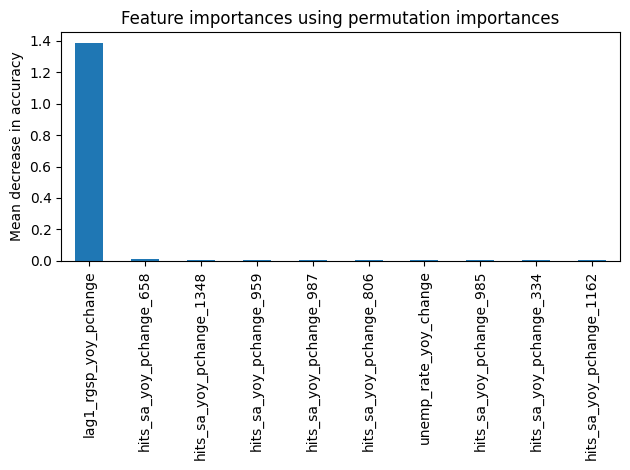

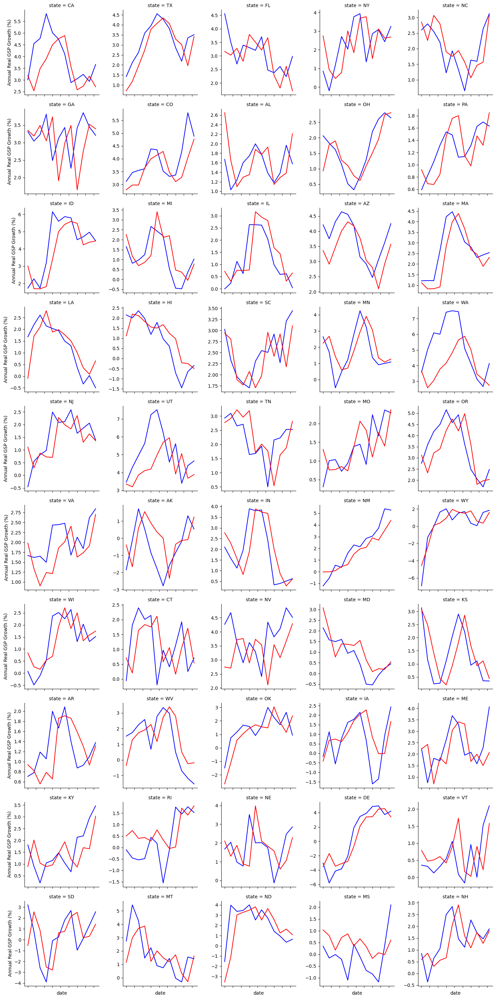

The RMSE for this model is 0.9577964689508172


In [50]:
warnings.filterwarnings('ignore')
# run Dynamic Factor Model regression, with economic variables and Google Trends
# Train: Pseudo-Out-Of-Sample RMSE

#rmse_df_RF = pd.DataFrame()
for dat in reg_data_RF[(reg_data_RF['date']>="2017-01-01")&(reg_data_RF['date']<"2020-01-01")]['date'].unique():
    
    X_RF = reg_data_RF[reg_data_RF['date']<dat].drop(['state','date','rgsp_yoy_pchange'],axis=1)
    
    y_RF = reg_data_RF[reg_data_RF['date']<dat]['rgsp_yoy_pchange']

#    param_grid = dict(n_estimators=[100,50,30,20],
#                  min_samples_leaf=[6,5,4,3,2,1],
#                  ccp_alpha=[ 0.0002, 0.0005, 0.00001,.01,0])

    # Specify classifier and scoring criterion
    #clf_rf = RandomForestRegressor()
#    roc = make_scorer(roc_auc_score)

    # This part specifies the rules of the grid search
    # Here we're testing through a 5-fold CV and finding the
    # combination that yields the highest accuracy
#    grid = GridSearchCV(estimator=clf_rf,
#                        param_grid=param_grid,
#                        verbose=1,
#                        cv=5,
#                        n_jobs=-1)

    # We actually run the search here
#    grid_result_rf = grid.fit(X_RF, y_RF)

    # You can access the results by grid_result attribute
#    print('Best Params: ', grid_result_rf.best_params_)

    #clf_rf = RandomForestRegressor(**grid_result_rf.best_params_).fit(X_RF,y_RF)

    #print(results2.summary())
#   X_new = reg_data_RF[reg_data_RF['date']==dat].drop(['state','date','rgsp_yoy_pchange'],axis=1)
    
#    y_new = reg_data_RF[reg_data_RF['date']==dat]['rgsp_yoy_pchange']

    #ypred = clf_rf.predict(X_new)

    #actual_gdp = reg_data_RF[reg_data_RF['date']==dat]['rgsp_yoy_pchange']
    #state1 = reg_data_RF[reg_data_RF['date']==dat]['state']
    #actual_gdp.reset_index(drop=True, inplace=True)
    #state1.reset_index(drop=True, inplace=True)
    #rmse1 = rmse(actual_gdp, ypred)
    #df2 = pd.DataFrame(data={'actual_gdp':actual_gdp,'pred_gdp':ypred,'state':state1,'date':[dat]*len(actual_gdp)})
    #rmse_df_RF = rmse_df_RF.append(df2)

%store -r

# calc rmse
def r2_rmse(g):
    rmse = np.sqrt(mean_squared_error(g['actual_gdp'], g['pred_gdp']))
    return rmse

RMSE_RF = rmse_df_RF.groupby('state').apply(r2_rmse).reset_index().mean()[0]



importances_permutation = permutation_importance(
    clf_rf, X_RF, y_RF, n_repeats=10, random_state=42, n_jobs=2
)

feature_names = X_RF.columns # all feature names, excluding outcome variable

permutation_importances = pd.Series(importances_permutation.importances_mean, index=feature_names).nlargest(10)

fig, ax = plt.subplots()
permutation_importances.plot.bar( ax=ax)
ax.set_title("Feature importances using permutation importances")
ax.set_ylabel("Mean decrease in accuracy")
fig.tight_layout()


g = sns.FacetGrid(rmse_df_RF.reset_index(), col="state", col_wrap=5,sharey=False)
g.map(sns.lineplot, "date","actual_gdp",color="blue")
g.map(sns.lineplot, "date","pred_gdp",color='red')
g.set_axis_labels(y_var="Annual Real GSP Growth (%)")
g.set_xticklabels(rotation=45)
plt.show()
g.savefig(charts_folder+"baseline_RF_forecasts.png")

print("The RMSE for this model is "+RMSE_RF.astype(str))

#%store rmse_df_RF 
#%store clf_rf

In [5]:
print(clf_rf)

RandomForestRegressor(ccp_alpha=1e-05, min_samples_leaf=6, n_estimators=20)


The RMSE for this model is 4.8480680472604805


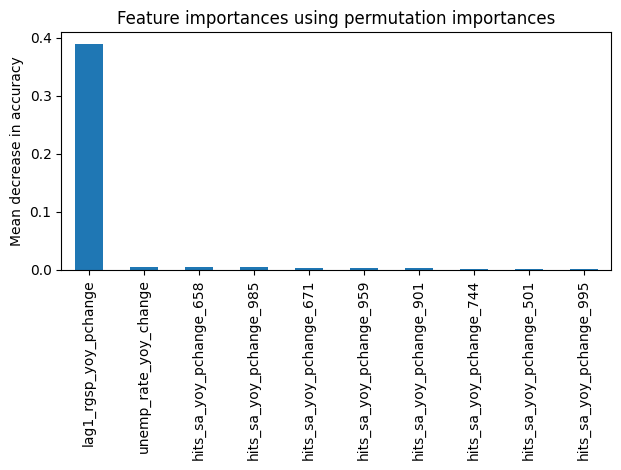

In [51]:
warnings.filterwarnings('ignore')
# run Dynamic Factor Model regression, with economic variables and Google Trends
# Train: Pseudo-Out-Of-Sample RMSE

rmse_df_RF_test = pd.DataFrame()

X_RF = reg_data_RF[reg_data_RF['date']>="2020-01-01"].drop(['state','date','rgsp_yoy_pchange'],axis=1)
    
y_RF = reg_data_RF[reg_data_RF['date']>="2020-01-01"]['rgsp_yoy_pchange']

ypred = clf_rf.predict(X_RF)

actual_gdp = reg_data_RF[reg_data_RF['date']>="2020-01-01"]['rgsp_yoy_pchange']
state1 = reg_data_RF[reg_data_RF['date']>="2020-01-01"]['state']
date1 = reg_data_RF[reg_data_RF['date']>="2020-01-01"]['date']
actual_gdp.reset_index(drop=True, inplace=True)
state1.reset_index(drop=True, inplace=True)
date1.reset_index(drop=True,inplace=True)
#rmse1 = rmse(actual_gdp, ypred)
df2 = pd.DataFrame(data={'actual_gdp':actual_gdp,'pred_gdp':ypred,'state':state1,'date':date1})
rmse_df_RF_test = rmse_df_RF_test.append(df2)

# calc rmse
def r2_rmse(g):
    rmse = np.sqrt(mean_squared_error(g['actual_gdp'], g['pred_gdp']))
    return rmse

RMSE_RF_test = rmse_df_RF_test.groupby('state').apply(r2_rmse).reset_index().mean()[0]



importances_permutation = permutation_importance(
    clf_rf, X_RF, y_RF, n_repeats=10, random_state=42, n_jobs=2
)

feature_names = X_RF.columns # all feature names, excluding outcome variable

permutation_importances = pd.Series(importances_permutation.importances_mean, index=feature_names).nlargest(10)

fig, ax = plt.subplots()
permutation_importances.plot.bar( ax=ax)
ax.set_title("Feature importances using permutation importances")
ax.set_ylabel("Mean decrease in accuracy")
fig.tight_layout()

print("The RMSE for this model is "+RMSE_RF_test.astype(str))

In [7]:
# Adopted from: 
# https://www.tensorflow.org/guide/keras/sequential_model

# and I also used this website to find optimal number of layers, nodes, etc.:
# https://datagraphi.com/blog/post/2019/12/17/how-to-find-the-optimum-number-of-hidden-layers-and-nodes-in-a-neural-network-model


def FindLayerNodesLinear(n_layers, first_layer_nodes, last_layer_nodes):
    layers = []
    
    nodes_increment = (last_layer_nodes - first_layer_nodes)/ (n_layers-1)
    nodes = first_layer_nodes
    for i in range(1, n_layers+1):
        layers.append(math.ceil(nodes))
        nodes = nodes + nodes_increment
    
    return layers
  
def createmodel(n_layers, first_layer_nodes, last_layer_nodes, activation_func,final_activation_func, loss_func,dropout_rate):
    model = keras.models.Sequential()
    n_nodes = FindLayerNodesLinear(n_layers, first_layer_nodes, last_layer_nodes)
    for i in range(1, n_layers):
        if i==1:
            model.add(keras.layers.Dense(first_layer_nodes, input_dim=X_train.shape[1], activation=activation_func))
            model.add(tf.keras.layers.Dropout(dropout_rate))
        else:
            model.add(keras.layers.Dense(n_nodes[i-1], activation=activation_func))
            model.add(tf.keras.layers.Dropout(dropout_rate))
            
    #Finally, the output layer should have a single node in binary classification
    model.add(keras.layers.Dense(1, activation=final_activation_func))
    model.compile(optimizer='adam', loss=loss_func, metrics = ["mse"]) #note: metrics could also be 'mse'
    
    return model
  
model =  KerasRegressor(build_fn=createmodel, verbose = False) 

activation_funcs = ['relu'] 
loss_funcs = ["MeanSquaredError"]
param_grid = dict(n_layers=[3,4,5,6,7], 
first_layer_nodes = [128,64,32,16], 
last_layer_nodes = [1],  
activation_func = activation_funcs, 
final_activation_func=['linear'],
dropout_rate=[0.3,0.2,0.1,0.05],
loss_func = loss_funcs)

grid = GridSearchCV(estimator = model, param_grid = param_grid)

C:\Users\16094\AppData\Local\Temp\ipykernel_6028\3596917150.py:36: DeprecationWarning: KerasRegressor is deprecated, use Sci-Keras (https://github.com/adriangb/scikeras) instead. See https://www.adriangb.com/scikeras/stable/migration.html for help migrating.
  model =  KerasRegressor(build_fn=createmodel, verbose = False)


Best Params:  -4.965346336364746
Best Params:  {'activation_func': 'relu', 'dropout_rate': 0.05, 'final_activation_func': 'linear', 'first_layer_nodes': 64, 'last_layer_nodes': 1, 'loss_func': 'MeanSquaredError', 'n_layers': 6}
Epoch 1/7
7/7 [==============================] - 1s 5ms/step - loss: 6.7042 - mse: 6.7042
Epoch 2/7
7/7 [==============================] - 0s 3ms/step - loss: 5.7172 - mse: 5.7172
Epoch 3/7
7/7 [==============================] - 0s 3ms/step - loss: 5.0223 - mse: 5.0223
Epoch 4/7
7/7 [==============================] - 0s 3ms/step - loss: 4.5376 - mse: 4.5376
Epoch 5/7
7/7 [==============================] - 0s 3ms/step - loss: 3.5543 - mse: 3.5543
Epoch 6/7
7/7 [==============================] - 0s 3ms/step - loss: 3.0932 - mse: 3.0932
Epoch 7/7
2/2 [==============================] - 0s 8ms/step
Best Params:  -4.549740314483643
Best Params:  {'activation_func': 'relu', 'dropout_rate': 0.05, 'final_activation_func': 'linear', 'first_layer_nodes': 128, 'last_layer_n

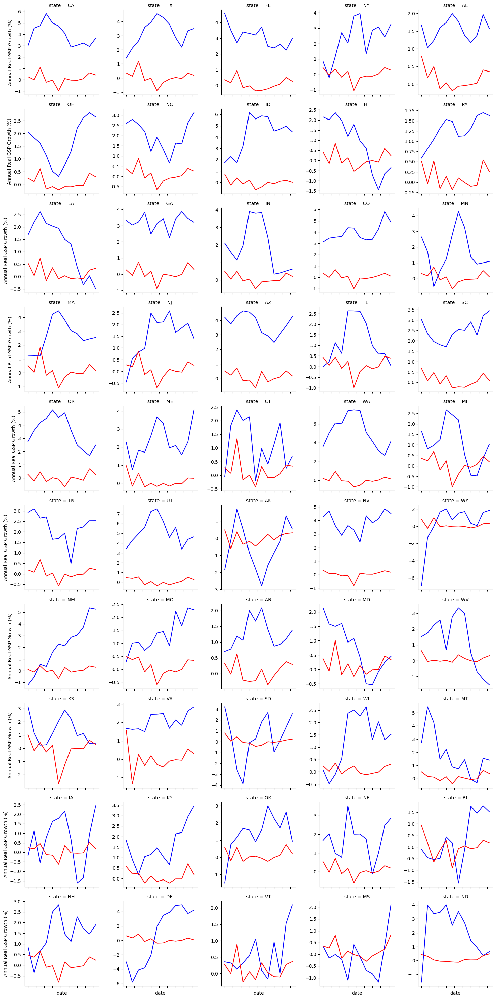

The RMSE for this model is 2.3687082122649463
Stored 'rmse_df_NN' (DataFrame)
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\dense
......vars
.........0
.........1
...layers\dense_1
......vars
.........0
.........1
...layers\dense_2
......vars
.........0
.........1
...layers\dense_3
......vars
.........0
.........1
...layers\dense_4
......vars
.........0
.........1
...layers\dropout
......vars
...layers\dropout_1
......vars
...layers\dropout_2
......vars
...layers\dropout_3
......vars
...metrics\mean
......vars
.........0
.........1
...metrics\mean_metric_wrapper
......vars
.........0
.........1
...optimizer
......vars
.........0
.........1
.........10
.........11
.........12
.........13
.........14
.........15
.........16
.........17
.........18
.........19
.........2
.........20
.........3
.........4
.........5
.........6
.........7
.........8
.........9
...vars
Keras model archive saving:
File Name                                             Modified    

In [8]:
warnings.filterwarnings('ignore')

reg_data_NN = reg_data_RF

rmse_df_NN = pd.DataFrame()
for dat in reg_data_NN[(reg_data_NN['date']>="2017-01-01")&(reg_data_NN['date']<"2020-01-01")]['date'].unique():
    
    X_train = reg_data_NN[reg_data_NN['date']<dat].drop(['state','date','rgsp_yoy_pchange'],axis=1)
    
    y_train = reg_data_NN[reg_data_NN['date']<dat]['rgsp_yoy_pchange']

    # We actually run the search here
    grid_result_NN = grid.fit(X_train,y_train,batch_size=32,epochs=7)

    # You can access the results by grid_result attribute
    print('Best Params: ', grid_result_NN.best_score_)
    print('Best Params: ', grid_result_NN.best_params_)

    clf_NN = createmodel(**grid_result_NN.best_params_).fit(X_train,y_train,batch_size=32,epochs=7)

    #print(results2.summary())
    X_new = reg_data_NN[reg_data_NN['date']==dat].drop(['state','date','rgsp_yoy_pchange'],axis=1)
    
    y_new = reg_data_NN[reg_data_NN['date']==dat]['rgsp_yoy_pchange']

    ypred = createmodel(**grid_result_NN.best_params_).predict(X_new)[:,0]

    actual_gdp = reg_data_NN[reg_data_NN['date']==dat]['rgsp_yoy_pchange']
    state1 = reg_data_NN[reg_data_NN['date']==dat]['state']
    actual_gdp.reset_index(drop=True, inplace=True)
    state1.reset_index(drop=True, inplace=True)
    #rmse1 = rmse(actual_gdp, ypred)
    df2 = pd.DataFrame(data={'actual_gdp':actual_gdp,'pred_gdp':ypred,'state':state1,'date':[dat]*len(actual_gdp)})
    rmse_df_NN = rmse_df_NN.append(df2)

#%store -r

# calc rmse
def r2_rmse(g):
    rmse = np.sqrt(mean_squared_error(g['actual_gdp'], g['pred_gdp']))
    return rmse

RMSE_NN = rmse_df_NN.groupby('state').apply(r2_rmse).reset_index().mean()[0]

g = sns.FacetGrid(rmse_df_NN.reset_index(), col="state", col_wrap=5,sharey=False)
g.map(sns.lineplot, "date","actual_gdp",color="blue")
g.map(sns.lineplot, "date","pred_gdp",color='red')
g.set_axis_labels(y_var="Annual Real GSP Growth (%)")
g.set_xticklabels(rotation=45)
plt.show()
g.savefig(charts_folder+"baseline_NN_forecasts.png")

print("The RMSE for this model is "+RMSE_NN.astype(str))

%store rmse_df_NN
%store clf_NN

In [9]:
warnings.filterwarnings('ignore')
# run Dynamic Factor Model regression, with economic variables and Google Trends
# Train: Pseudo-Out-Of-Sample RMSE

rmse_df_NN_test = pd.DataFrame()

X_NN = reg_data_NN[reg_data_NN['date']>="2020-01-01"].drop(['state','date','rgsp_yoy_pchange'],axis=1)
    
y_NN = reg_data_NN[reg_data_NN['date']>="2020-01-01"]['rgsp_yoy_pchange']

ypred = createmodel(**grid_result_NN.best_params_).predict(X_NN)[:,0]

actual_gdp = reg_data_NN[reg_data_NN['date']>="2020-01-01"]['rgsp_yoy_pchange']
state1 = reg_data_NN[reg_data_NN['date']>="2020-01-01"]['state']
actual_gdp.reset_index(drop=True, inplace=True)
state1.reset_index(drop=True, inplace=True)
#rmse1 = rmse(actual_gdp, ypred)
df2 = pd.DataFrame(data={'actual_gdp':actual_gdp,'pred_gdp':ypred,'state':state1,'date':[dat]*len(actual_gdp)})
rmse_df_NN_test = rmse_df_NN_test.append(df2)

# calc rmse
def r2_rmse(g):
    rmse = np.sqrt(mean_squared_error(g['actual_gdp'], g['pred_gdp']))
    return rmse

RMSE_NN_test = rmse_df_NN_test.groupby('state').apply(r2_rmse).reset_index().mean()[0]

print("The RMSE for this model is "+RMSE_NN_test.astype(str))

16/16 [==============================] - 0s 6ms/step
The RMSE for this model is 5.488414899261478


In [3]:
# prepare data for LSTM
# explanation of what we need from LSTM
# Data should be a dataframe with rows of the highest granularity of data and a date column. 
# For example, predicting a yearly variable with monthly, quarterly, and yearly features should 
# have a monthly dataframe. Quarterly variables should be represented as a single value during the period, 
# with missings (`np.nan`) in between. E.g. Q1 data would be `np.nan` for January, `np.nan` for February, 
# the value for March, etc. Yearly data would be `np.nan` for January - November, and the value for December.
weekly_data_lstm = pd.read_csv(data_folder+"Processing/weekly_data_lstm.csv",parse_dates=["date"])

In [4]:
warnings.filterwarnings('ignore')
# run basic autoregression
# LSTM
# Train: Pseudo-Out-Of-Sample RMSE

rmse_df_LSTM = pd.DataFrame()
for stat in states.keys():
    for dat in weekly_data_lstm[(weekly_data_lstm['date']>="2017-01-01")&(weekly_data_lstm['date']<"2020-01-01")&(~weekly_data_lstm['quarter'].isnull())]['date'].unique():
        train_data = weekly_data_lstm[(weekly_data_lstm['date']<dat)&(weekly_data_lstm['state']==stat)].drop(["year","quarter","month","lag2_rgsp_yoy_pchange","lag3_rgsp_yoy_pchange","lag4_rgsp_yoy_pchange"],axis=1)
        train_data = train_data.drop(train_data.columns[0], axis=1)
        train_data = train_data.reset_index()

        model = LSTM(data=train_data, target_variable="rgsp_yoy_pchange", n_timesteps=13, n_models=10, train_episodes=50)

        model.train(quiet=True)
        # getting predictions on the train set

        test_data = weekly_data_lstm[(weekly_data_lstm['date']<=dat)&(weekly_data_lstm['state']==stat)].drop(["year","quarter","month","lag2_rgsp_yoy_pchange","lag3_rgsp_yoy_pchange","lag4_rgsp_yoy_pchange"],axis=1)
        test_data = test_data.drop(test_data.columns[0], axis=1)
        test_data = test_data.reset_index()
        test_preds = model.predict(test_data, only_actuals_obs=True) # passing the full dataset, then filtering only for predictions on dates the model wasn't trained on

        #selection_results = select_model(train_data, "rgsp_yoy_pchange", n_models=10, n_timesteps_grid = [13,26,39,52], train_episodes_grid = [50,100, 200], batch_size_grid = [30], n_hidden_grid = [10, 20], n_layers_grid = [2,3,4], n_folds=5, init_test_size = 0.5, initial_ordering="univariate")
        # and this is where we would run the optimized model. Only do this for the test recession score
        #model2 = LSTM(training.loc[:, ["date", target] + ['x_de', 'x_uk', 'ipi_cn']], target, n_timesteps=6, n_models=10, train_episodes=200, batch_size=30, n_hidden=20, n_layers=2)
        #model2.train(quiet=True)
        #test_preds = model2.predict(data.loc[:, ["date", target] + ['x_de', 'x_uk', 'ipi_cn']], only_actuals_obs=True).loc[lambda x: x.date > train_end_date,:] # passing the full dataset, then filtering only for predictions on dates the model wasn't trained on

        
        df2 = test_preds[test_preds['date']==dat]
        df2 = df2.rename({'actuals':'actual_gdp','predictions':'pred_gdp'}, axis=1)
        rmse_df_LSTM = rmse_df_LSTM.append(df2)
        print("model done "+str(dat))

    

# calc rmse
def r2_rmse(g):
    rmse = np.sqrt(mean_squared_error(g['actual_gdp'], g['pred_gdp']))
    return rmse

RMSE_LSTM = rmse_df_LSTM.groupby('state').apply(r2_rmse).reset_index().mean()[0]

g = sns.FacetGrid(rmse_df_LSTM.reset_index(), col="state", col_wrap=5,sharey=False)
g.map(sns.lineplot, "date","actual_gdp",color="blue")
g.map(sns.lineplot, "date","pred_gdp",color='red')
g.set_axis_labels(y_var="Annual Real GSP Growth (%)")
g.set_xticklabels(rotation=45)
plt.show()
g.savefig(charts_folder+"baseline_LSTM_forecasts.png")

print("The RMSE for this model is "+RMSE_LSTM.astype(str))

model_LSTM = model 

%store rmse_df_LSTM
#%store model_LSTM

model done 2017-03-26T00:00:00.000000000
model done 2017-06-25T00:00:00.000000000
model done 2017-09-24T00:00:00.000000000
model done 2017-12-31T00:00:00.000000000
model done 2018-03-25T00:00:00.000000000
model done 2018-06-24T00:00:00.000000000
model done 2018-09-30T00:00:00.000000000
model done 2018-12-30T00:00:00.000000000
model done 2019-03-31T00:00:00.000000000
model done 2019-06-30T00:00:00.000000000
model done 2019-09-29T00:00:00.000000000
model done 2019-12-29T00:00:00.000000000
model done 2017-03-26T00:00:00.000000000
model done 2017-06-25T00:00:00.000000000
model done 2017-09-24T00:00:00.000000000
model done 2017-12-31T00:00:00.000000000
model done 2018-03-25T00:00:00.000000000
model done 2018-06-24T00:00:00.000000000
model done 2018-09-30T00:00:00.000000000
model done 2018-12-30T00:00:00.000000000
model done 2019-03-31T00:00:00.000000000
model done 2019-06-30T00:00:00.000000000
model done 2019-09-29T00:00:00.000000000
model done 2019-12-29T00:00:00.000000000
model done 2017-

KeyError: 'state'

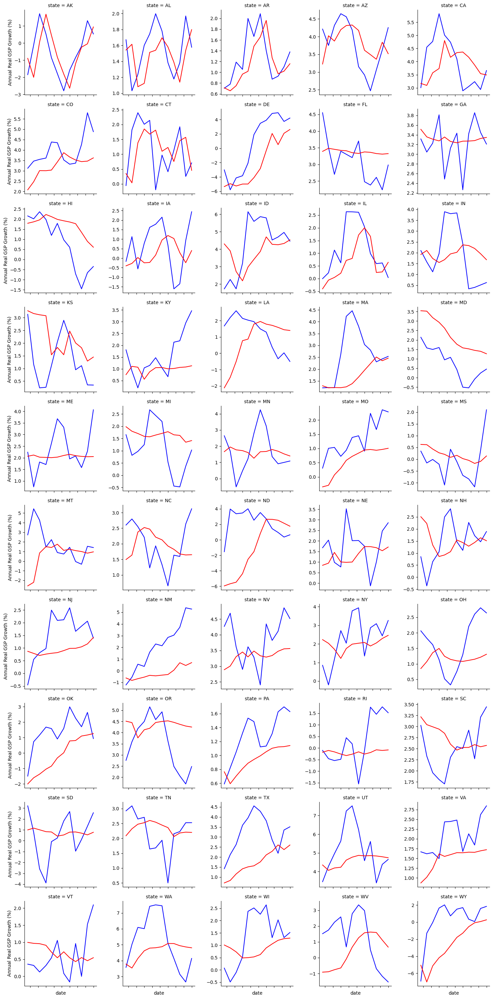

The RMSE for this model is 1.4011074322016568
Stored 'rmse_df_LSTM1' (DataFrame)


In [15]:
rmse_df_LSTM1 = pd.concat([rmse_df_LSTM.reset_index(drop=True),pd.DataFrame(list(itertools.chain(*[np.repeat(stat,12).tolist() for stat in states.keys()])))],axis=1)
rmse_df_LSTM1 = rmse_df_LSTM1.rename({0:'state'},axis=1)

RMSE_LSTM = rmse_df_LSTM1.groupby('state').apply(r2_rmse).reset_index().mean()[0]

g = sns.FacetGrid(rmse_df_LSTM1.reset_index(), col="state", col_wrap=5,sharey=False)
g.map(sns.lineplot, "date","actual_gdp",color="blue")
g.map(sns.lineplot, "date","pred_gdp",color='red')
g.set_axis_labels(y_var="Annual Real GSP Growth (%)")
g.set_xticklabels(rotation=45)
plt.show()
g.savefig(charts_folder+"baseline_LSTM_forecasts.png")

print("The RMSE for this model is "+RMSE_LSTM.astype(str))

model_LSTM = model 

%store rmse_df_LSTM1

In [63]:
warnings.filterwarnings('ignore')
# run Dynamic Factor Model regression, with economic variables and Google Trends
# Train: Pseudo-Out-Of-Sample RMSE

rmse_df_LSTM_test = pd.DataFrame()

for stat in states.keys():
    train_data = weekly_data_lstm[(weekly_data_lstm['date']<"2020-01-01")&(weekly_data_lstm['state']==stat)].drop(["year","quarter","month","lag2_rgsp_yoy_pchange","lag3_rgsp_yoy_pchange","lag4_rgsp_yoy_pchange"],axis=1)
    train_data = train_data.drop(train_data.columns[0], axis=1)
    train_data = train_data.reset_index()

    model = LSTM(data=train_data, target_variable="rgsp_yoy_pchange", n_timesteps=13, n_models=10, train_episodes=50)

    model.train(quiet=True)
    # getting predictions on the train set

    test_data = weekly_data_lstm[(weekly_data_lstm['state']==stat)].drop(["year","quarter","month","lag2_rgsp_yoy_pchange","lag3_rgsp_yoy_pchange","lag4_rgsp_yoy_pchange"],axis=1)
    test_data = test_data.drop(test_data.columns[0], axis=1)
    test_data = test_data.reset_index()
    test_preds = model.predict(test_data, only_actuals_obs=True) # passing the full dataset, then filtering only for predictions on dates the model wasn't trained on

    #selection_results = select_model(train_data, "rgsp_yoy_pchange", n_models=10, n_timesteps_grid = [13,26,39,52], train_episodes_grid = [50,100, 200], batch_size_grid = [30], n_hidden_grid = [10, 20], n_layers_grid = [2,3,4], n_folds=5, init_test_size = 0.5, initial_ordering="univariate")
    # and this is where we would run the optimized model. Only do this for the test recession score
    #model2 = LSTM(training.loc[:, ["date", target] + ['x_de', 'x_uk', 'ipi_cn']], target, n_timesteps=6, n_models=10, train_episodes=200, batch_size=30, n_hidden=20, n_layers=2)
    #model2.train(quiet=True)
    #test_preds = model2.predict(data.loc[:, ["date", target] + ['x_de', 'x_uk', 'ipi_cn']], only_actuals_obs=True).loc[lambda x: x.date > train_end_date,:] # passing the full dataset, then filtering only for predictions on dates the model wasn't trained on

    test_states = weekly_data_lstm[(~weekly_data_lstm['rgsp_yoy_pchange'].isnull())&(~weekly_data_lstm['quarter'].isnull())&(weekly_data_lstm['date']>="2020-01-01")&(weekly_data_lstm['state']==stat)]['state']
    test_states = test_states.reset_index()
    df2 = pd.concat([test_preds[test_preds['date']>="2020-01-01"].reset_index(),test_states],axis=1)
    df2 = df2.rename({'actuals':'actual_gdp','predictions':'pred_gdp'}, axis=1)
    rmse_df_LSTM_test = rmse_df_LSTM_test.append(df2)
    print(stat)

def r2_rmse(g):
    rmse = np.sqrt(mean_squared_error(g['actual_gdp'], g['pred_gdp']))
    return rmse

RMSE_LSTM_test= rmse_df_LSTM_test.groupby('state').apply(r2_rmse).reset_index().mean()[0]

print("The RMSE for this model is "+RMSE_LSTM_test.astype(str))

AK
AL
AR
AZ
CA
CO
CT
DE
FL
GA
HI
IA
ID
IL
IN
KS
KY
LA
MA
MD
ME
MI
MN
MO
MS
MT
NC
ND
NE
NH
NJ
NM
NV
NY
OH
OK
OR
PA
RI
SC
SD
TN
TX
UT
VA
VT
WA
WI
WV
WY
The RMSE for this model is 5.2544177273855155


In [16]:
# last ditch effort: auto-arimax
from pmdarima.arima import auto_arima
from statsmodels.tsa.arima.model import ARIMA

2017-01-01T00:00:00.000000000
2017-04-01T00:00:00.000000000
2017-07-01T00:00:00.000000000
2017-10-01T00:00:00.000000000
2018-01-01T00:00:00.000000000
2018-04-01T00:00:00.000000000
2018-07-01T00:00:00.000000000
2018-10-01T00:00:00.000000000
2019-01-01T00:00:00.000000000
2019-04-01T00:00:00.000000000
2019-07-01T00:00:00.000000000
2019-10-01T00:00:00.000000000
3.031310960093067


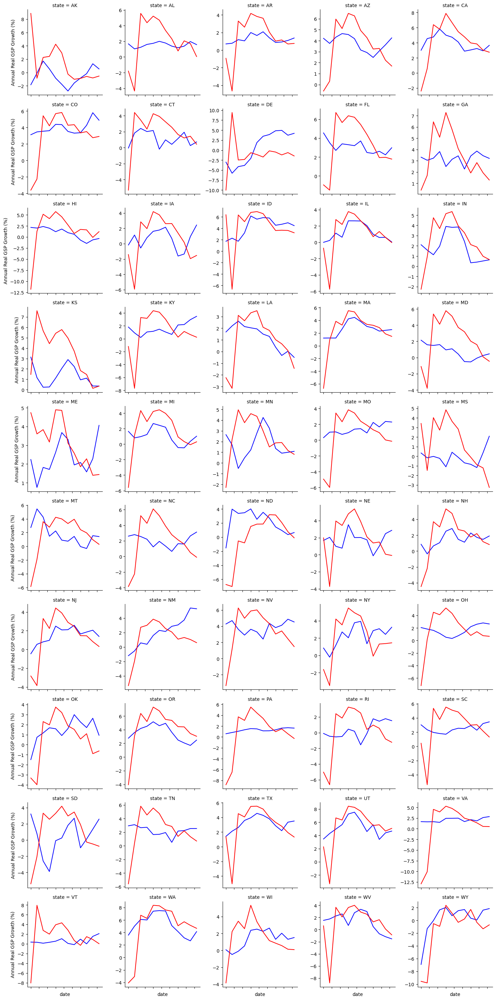

The RMSE for this model is 3.031310960093067


In [4]:
warnings.filterwarnings('ignore')
# run basic autoregression with economic variables and google trends
# BASELINE ARIMA
# Train: Pseudo-Out-Of-Sample RMSE

arima_preds = pd.DataFrame()
for dat in reg_data_AR[(reg_data_AR['date']>="2017-01-01")&(reg_data_AR['date']<"2020-01-01")]['date'].unique():
    train_data = reg_data_AR[reg_data_AR.columns[reg_data_AR.columns.isin(['rgsp_yoy_pchange','unemp_rate_yoy_change','lfpr_yoy_change']+list(trends_sa_wide_pchange_yoy_quarterly.columns[3:len(trends_sa_wide_pchange_yoy_quarterly.columns)])+list(states.keys()))]]
    trainy = train_data[(reg_data_AR['date']<dat)]['rgsp_yoy_pchange']
    trainx = train_data[(reg_data_AR['date']<dat)].drop(['rgsp_yoy_pchange'],axis=1)

    model_arima = ARIMA(trainy,exog=trainx, order=(1,0,1)).fit()

    train_data = reg_data_AR[reg_data_AR.columns[reg_data_AR.columns.isin(['rgsp_yoy_pchange','unemp_rate_yoy_change','lfpr_yoy_change']+pd.DataFrame(model_arima.pvalues[model_arima.pvalues<.1]).drop(['sigma2','const',"ar.L1","ma.L1"],axis=0,errors="ignore").index.tolist()+list(states.keys()))]]
    trainy = train_data[(reg_data_AR['date']<dat)]['rgsp_yoy_pchange']
    trainx = train_data[(reg_data_AR['date']<dat)].drop(['rgsp_yoy_pchange'],axis=1)

    model_arima = ARIMA(trainy,exog=trainx, order=(1,0,1)).fit()

    #print(results2.summary())
    for stat in states.keys():
        preds = model_arima.forecast(1, exog=train_data[(reg_data_AR['date']==dat)&(reg_data_AR['state']==stat)].drop(['rgsp_yoy_pchange'],axis=1), alpha=0.05)
        arima_preds = arima_preds.append(pd.concat([reg_data_AR[(reg_data_AR['date']==dat)&(reg_data_AR['state']==stat)]['date'].reset_index(drop=True),reg_data_AR[(reg_data_AR['date']==dat)&(reg_data_AR['state']==stat)]['state'].reset_index(drop=True),reg_data_AR[(reg_data_AR['date']==dat)&(reg_data_AR['state']==stat)]['rgsp_yoy_pchange'].reset_index(drop=True),preds.reset_index(drop=True)],axis=1))
    print(dat)

arima_preds  = arima_preds.rename({0:'predicted_mean'},axis=1)

def r2_rmse(g):
    rmse = np.sqrt(mean_squared_error(g['rgsp_yoy_pchange'], g['predicted_mean']))
    return rmse

RMSE_ARIMA = arima_preds.groupby('state').apply(r2_rmse).reset_index().mean()[0]
print(RMSE_ARIMA)

g = sns.FacetGrid(arima_preds.reset_index(), col="state", col_wrap=5,sharey=False)
g.map(sns.lineplot, "date","rgsp_yoy_pchange",color="blue")
g.map(sns.lineplot, "date","predicted_mean",color='red')
g.set_axis_labels(y_var="Annual Real GSP Growth (%)")
g.set_xticklabels(rotation=45)
plt.show()
g.savefig(charts_folder+"baseline_ARIMA_ECON_GT_forecasts.png")

print("The RMSE for this model is "+RMSE_ARIMA.astype(str))

In [7]:
model_arima.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:       rgsp_yoy_pchange   No. Observations:                  750
Model:                 ARIMA(1, 0, 1)   Log Likelihood               -1020.116
Date:                Sun, 04 Dec 2022   AIC                           2216.231
Time:                        11:27:15   BIC                           2622.798
Sample:                             0   HQIC                          2372.890
                                - 750                                         
Covariance Type:                  opg                                         
============================================================================================
                               coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------------
const                        1.4383      0.193      7.440      0.000       1.059       1.817
hits_sa_yoy_pchange_468     -0.0220      0.007     -3.100      0.002      -0.036      -0.008
hits_sa_yoy_pchange_205  -1.226e-05      0.005     -0.002      0.998      -0.010       0.010
hits_sa_yoy_pchange_463      0.0133      0.006      2.336      0.019       0.002       0.024
hits_sa_yoy_pchange_667      0.0075      0.004      1.801      0.072      -0.001       0.016
hits_sa_yoy_pchange_1268     0.0003      0.003      0.123      0.902      -0.005       0.005
hits_sa_yoy_pchange_1085     0.0073      0.003      2.225      0.026       0.001       0.014
hits_sa_yoy_pchange_384     -0.0047      0.007     -0.650      0.516      -0.019       0.009
hits_sa_yoy_pchange_726      0.0092      0.005      1.746      0.081      -0.001       0.020
hits_sa_yoy_pchange_1081     0.0204      0.009      2.285      0.022       0.003       0.038
hits_sa_yoy_pchange_1220     0.0268      0.006      4.194      0.000       0.014       0.039
hits_sa_yoy_pchange_145     -0.0114      0.009     -1.213      0.225      -0.030       0.007
hits_sa_yoy_pchange_746     -0.0260      0.005     -5.272      0.000      -0.036      -0.016
hits_sa_yoy_pchange_717      0.0203      0.009      2.159      0.031       0.002       0.039
hits_sa_yoy_pchange_719     -0.0143      0.004     -4.067      0.000      -0.021      -0.007
hits_sa_yoy_pchange_720     -0.0070      0.004     -1.742      0.081      -0.015       0.001
hits_sa_yoy_pchange_811      0.0012      0.009      0.128      0.898      -0.017       0.019
hits_sa_yoy_pchange_995     -0.0125      0.006     -1.949      0.051      -0.025    7.07e-05
hits_sa_yoy_pchange_997      0.0365      0.008      4.811      0.000       0.022       0.051
hits_sa_yoy_pchange_993     -0.0023      0.003     -0.675      0.500      -0.009       0.004
hits_sa_yoy_pchange_992     -0.0023      0.004     -0.648      0.517      -0.009       0.005
hits_sa_yoy_pchange_891     -0.0227      0.004     -5.796      0.000      -0.030      -0.015
hits_sa_yoy_pchange_815      0.0261      0.005      5.301      0.000       0.016       0.036
hits_sa_yoy_pchange_211     -0.0210      0.011     -1.991      0.047      -0.042      -0.000
hits_sa_yoy_pchange_906      0.0007      0.008      0.088      0.930      -0.014       0.016
hits_sa_yoy_pchange_566     -0.0277      0.008     -3.558      0.000      -0.043      -0.012
hits_sa_yoy_pchange_651     -0.0126      0.005     -2.682      0.007      -0.022      -0.003
hits_sa_yoy_pchange_657   3.998e-05      0.005      0.009      0.993      -0.009       0.009
hits_sa_yoy_pchange_1190    -0.0018      0.002     -0.728      0.466      -0.007       0.003
hits_sa_yoy_pchange_1210    -0.0060      0.004     -1.634      0.102      -0.013       0.001
hits_sa_yoy_pchange_1214     0.0069      0.006      1.135      0.256      -0.005       0.019
hits_sa_yoy_pchange_158     -0.0152      0.011     -1.391      0.164      -0.03

In [5]:
testdf = pd.DataFrame()
testdf = testdf.append(pd.concat([model_arima.pvalues.reset_index(),pd.DataFrame(np.repeat("All",len(model_arima.pvalues.reset_index())))],axis=1,ignore_index=True),ignore_index=True)
testdf.to_csv(data_folder+"Processing/ARMAX_coeffs_data_precovid.csv",index=True)

2.343962009896784


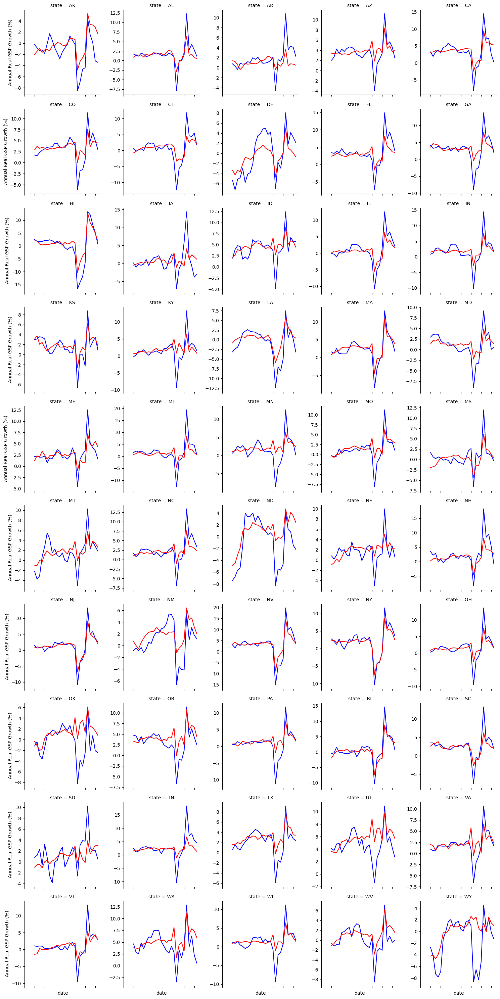

The RMSE for this model is 2.343962009896784


In [8]:
warnings.filterwarnings('ignore')
# run basic autoregression with economic variables and google trends
# BASELINE ARIMA
# Train: Pseudo-Out-Of-Sample RMSE

arima_preds_test = pd.DataFrame()

train_data = reg_data_AR[reg_data_AR.columns[reg_data_AR.columns.isin(['rgsp_yoy_pchange','unemp_rate_yoy_change','lfpr_yoy_change']+list(trends_sa_wide_pchange_yoy_quarterly.columns[3:len(trends_sa_wide_pchange_yoy_quarterly.columns)])+list(states.keys()))]]
trainy = train_data[(reg_data_AR['date']<'2020-01-01')]['rgsp_yoy_pchange']
trainx = train_data[(reg_data_AR['date']<'2020-01-01')].drop(['rgsp_yoy_pchange'],axis=1)

model_arima = ARIMA(trainy,exog=trainx, order=(1,0,1)).fit()

train_data = reg_data_AR[reg_data_AR.columns[reg_data_AR.columns.isin(['rgsp_yoy_pchange','unemp_rate_yoy_change','lfpr_yoy_change']+pd.DataFrame(model_arima.pvalues[model_arima.pvalues<.1]).drop(['sigma2','const',"ar.L1","ma.L1"],axis=0,errors="ignore").index.tolist()+list(states.keys()))]]
trainy = train_data[(reg_data_AR['date']<'2020-01-01')]['rgsp_yoy_pchange']
trainx = train_data[(reg_data_AR['date']<'2020-01-01')].drop(['rgsp_yoy_pchange'],axis=1)

model_arima = ARIMA(trainy,exog=trainx, order=(1,0,1)).fit()

#print(results2.summary())
arima_preds_test = pd.DataFrame()
for stat in states.keys():
    preds = model_arima.forecast(26, exog=train_data[(reg_data_AR['state']==stat)].drop(['rgsp_yoy_pchange'],axis=1), alpha=0.05)
    arima_preds_test = arima_preds_test.append(pd.concat([reg_data_AR[(reg_data_AR['state']==stat)]['date'].reset_index(drop=True),reg_data_AR[(reg_data_AR['state']==stat)]['state'].reset_index(drop=True),reg_data_AR[(reg_data_AR['state']==stat)]['rgsp_yoy_pchange'].reset_index(drop=True),preds.reset_index(drop=True)],axis=1))

def r2_rmse(g):
    rmse = np.sqrt(mean_squared_error(g['rgsp_yoy_pchange'], g['predicted_mean']))
    return rmse

RMSE_ARIMA_test = arima_preds_test.groupby('state').apply(r2_rmse).reset_index().mean()[0]
print(RMSE_ARIMA_test)

g = sns.FacetGrid(arima_preds_test.reset_index(), col="state", col_wrap=5,sharey=False)
g.map(sns.lineplot, "date","rgsp_yoy_pchange",color="blue")
g.map(sns.lineplot, "date","predicted_mean",color='red')
g.set_axis_labels(y_var="Annual Real GSP Growth (%)")
g.set_xticklabels(rotation=45)
plt.show()
g.savefig(charts_folder+"test_ARIMA_ECON_GT_forecasts.png")

print("The RMSE for this model is "+RMSE_ARIMA_test.astype(str))

In [197]:
print(RMSE_AR)
print(RMSE_AR_ECON)
print(RMSE_AR_ECON_GT)
print(RMSE_ELNET)
print(RMSE_ELNET_ECON)
print(RMSE_ELNET_ECON_GT)
print(RMSE_DFM)
print(RMSE_MIDAS)
print(RMSE_RF)
print(RMSE_NN)
print(RMSE_LSTM)
print(RMSE_ARIMA)

1.027401889123885
1.0524611720710453
3.0511204767206026
0.9652656478426931
0.970669617864508
1.1822610691311268
1.0549503944162846
1.970824704637392
0.9577964689508172
2.28691806292642
1.4011074322016568
3.031310960093067


In [199]:
print(RMSE_AR_test)
print(RMSE_AR_ECON_test)
print(RMSE_AR_ECON_GT_test)
print(RMSE_ELNET_test)
print(RMSE_ELNET_ECON_test)
print(RMSE_ELNET_ECON_GT_test)
print(RMSE_DFM_test)
print(RMSE_MIDAS_test)
print(RMSE_RF_test)
print(RMSE_NN_test)
print(RMSE_LSTM_test)
print(RMSE_ARIMA_test)

5.12832645380077
4.52487887614873
6.07087210569313
5.315726282781201
5.091742718649238
5.614117064845227
4.621289934576933
4.855510747889116
4.8480680472604805
5.33304964610404
4.262267834743109
3.939021341022882


2017-01-01T00:00:00.000000000
2017-04-01T00:00:00.000000000
2017-07-01T00:00:00.000000000
2017-10-01T00:00:00.000000000
2018-01-01T00:00:00.000000000
2018-04-01T00:00:00.000000000
2018-07-01T00:00:00.000000000
2018-10-01T00:00:00.000000000
2019-01-01T00:00:00.000000000
2019-04-01T00:00:00.000000000
2019-07-01T00:00:00.000000000
2019-10-01T00:00:00.000000000
2020-01-01T00:00:00.000000000
2020-04-01T00:00:00.000000000
2020-07-01T00:00:00.000000000
2020-10-01T00:00:00.000000000
2021-01-01T00:00:00.000000000
2021-04-01T00:00:00.000000000
2021-07-01T00:00:00.000000000
2021-10-01T00:00:00.000000000
2022-01-01T00:00:00.000000000
2022-04-01T00:00:00.000000000


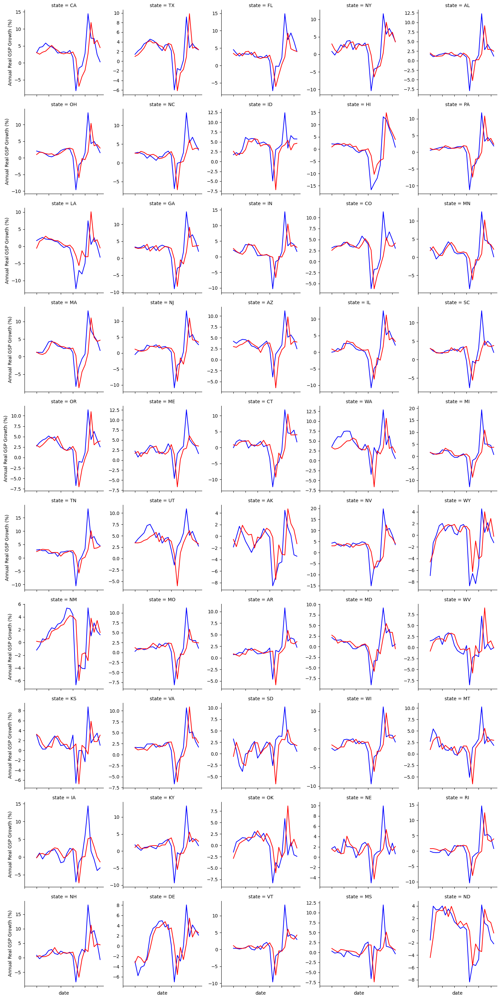

The RMSE for this model is 3.583875042127173


In [182]:
warnings.filterwarnings('ignore')
# Nowcast with best model

rmse_df_RF1 = pd.DataFrame()
for dat in reg_data_RF[(reg_data_RF['date']>="2017-01-01")]['date'].unique():
    
    X_RF = reg_data_RF[reg_data_RF['date']<dat].drop(['state','date','rgsp_yoy_pchange'],axis=1)
    
    y_RF = reg_data_RF[reg_data_RF['date']<dat]['rgsp_yoy_pchange']

    clf_rf1 = RandomForestRegressor(ccp_alpha=1e-05, min_samples_leaf=6, n_estimators=20).fit(X_RF,y_RF)

    #print(results2.summary())
    X_new = reg_data_RF[reg_data_RF['date']==dat].drop(['state','date','rgsp_yoy_pchange'],axis=1)
    
    y_new = reg_data_RF[reg_data_RF['date']==dat]['rgsp_yoy_pchange']

    ypred = clf_rf1.predict(X_new)

    actual_gdp = reg_data_RF[reg_data_RF['date']==dat]['rgsp_yoy_pchange']
    state1 = reg_data_RF[reg_data_RF['date']==dat]['state']
    actual_gdp.reset_index(drop=True, inplace=True)
    state1.reset_index(drop=True, inplace=True)
    rmse1 = rmse(actual_gdp, ypred)
    df2 = pd.DataFrame(data={'actual_gdp':actual_gdp,'pred_gdp':ypred,'state':state1,'date':[dat]*len(actual_gdp)})
    rmse_df_RF1 = rmse_df_RF1.append(df2)
    print(dat)

# calc rmse
def r2_rmse(g):
    rmse = np.sqrt(mean_squared_error(g['actual_gdp'], g['pred_gdp']))
    return rmse

RMSE_RF1 = rmse_df_RF1.groupby('state').apply(r2_rmse).reset_index().mean()[0]


g = sns.FacetGrid(rmse_df_RF1.reset_index(), col="state", col_wrap=5,sharey=False)
g.map(sns.lineplot, "date","actual_gdp",color="blue")
g.map(sns.lineplot, "date","pred_gdp",color='red')
g.set_axis_labels(y_var="Annual Real GSP Growth (%)")
g.set_xticklabels(rotation=45)
plt.show()
g.savefig(charts_folder+"fullsample_RF_forecasts.png")

print("The RMSE for this model is "+RMSE_RF1.astype(str))

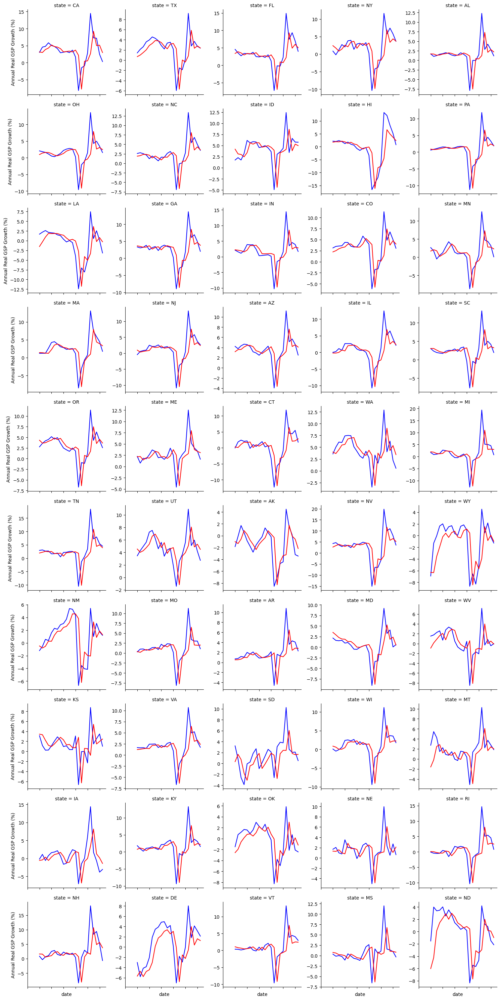

The RMSE for this model is 3.653545487915215


In [177]:
warnings.filterwarnings('ignore')
# run basic autoregression
# BASELINE
# Train: Pseudo-Out-Of-Sample RMSE

reg_data_AR = reg_data
dummies = pd.get_dummies(reg_data_AR['state'])
reg_data_AR = pd.concat([reg_data_AR,dummies],axis=1)

rmse_df_AR1 = pd.DataFrame()
for dat in reg_data_AR[reg_data_AR['date']>="2017-01-01"]['date'].unique():
    X=sm.add_constant(reg_data_AR[reg_data_AR['date']<dat][reg_data_AR.columns[reg_data_AR.columns.isin(['lag1_rgsp_yoy_pchange']+list(states.keys()))]])
    
    model = sm.OLS(reg_data_AR[reg_data_AR['date']<dat]["rgsp_yoy_pchange"],X)
    results_AR_train = model.fit(cov_type='HC3')
    #print(results2.summary())
    ypred = results_AR_train.predict(sm.add_constant(reg_data_AR[reg_data_AR['date']==dat][reg_data_AR.columns[reg_data_AR.columns.isin(['lag1_rgsp_yoy_pchange']+list(states.keys()))]]))
    actual_gdp = reg_data_AR[reg_data_AR['date']==dat]['rgsp_yoy_pchange']
    state1 = reg_data_AR[reg_data_AR['date']==dat]['state']
    #rmse1 = rmse(actual_gdp, ypred)
    df2 = pd.DataFrame(data={'actual_gdp':actual_gdp,'pred_gdp':ypred,'state':state1,'date':[dat]*len(actual_gdp)})
    rmse_df_AR1 = rmse_df_AR1.append(df2)

# calc rmse
def r2_rmse(g):
    rmse = np.sqrt(mean_squared_error(g['actual_gdp'], g['pred_gdp']))
    return rmse

RMSE_AR1 = rmse_df_AR1.groupby('state').apply(r2_rmse).reset_index().mean()[0]



g = sns.FacetGrid(rmse_df_AR1.reset_index(), col="state", col_wrap=5,sharey=False)
g.map(sns.lineplot, "date","actual_gdp",color="blue")
g.map(sns.lineplot, "date","pred_gdp",color='red')
g.set_axis_labels(y_var="Annual Real GSP Growth (%)")
g.set_xticklabels(rotation=45)
plt.show()
g.savefig(charts_folder+"fullsample_AR_forecasts.png")

print("The RMSE for this model is "+RMSE_AR1.astype(str))

In [188]:
# Which one performs the best in Q1 2020 to Q3 2020
def r2_rmse(g):
    rmse = np.sqrt(mean_squared_error(g['actual_gdp'], g['pred_gdp']))
    return rmse
print(rmse_df_AR1[(rmse_df_AR1['date']>='2020-01-01')&(rmse_df_AR1['date']<="2020-10-01")].groupby('state').apply(r2_rmse).reset_index().mean()[0])
print(rmse_df_RF1[(rmse_df_RF1['date']>='2020-01-01')&(rmse_df_RF1['date']<="2020-10-01")].groupby('state').apply(r2_rmse).reset_index().mean()[0])
def r2_rmse(g):
    rmse = np.sqrt(mean_squared_error(g['rgsp_yoy_pchange'], g['predicted_mean']))
    return rmse
print(arima_preds_test[(arima_preds_test['date']>='2020-01-01')&(arima_preds_test['date']<="2020-10-01")].groupby('state').apply(r2_rmse).reset_index().mean()[0])

5.658137985896108
5.335720767542773
4.821614566658228


In [11]:
dill.dump_session(data_folder+'Processing/notebook_env.db')

Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\dense
......vars
.........0
.........1
...layers\dense_1
......vars
.........0
.........1
...layers\dense_2
......vars
.........0
.........1
...layers\dense_3
......vars
.........0
.........1
...layers\dense_4
......vars
.........0
.........1
...layers\dropout
......vars
...layers\dropout_1
......vars
...layers\dropout_2
......vars
...layers\dropout_3
......vars
...metrics\mean
......vars
.........0
.........1
...metrics\mean_metric_wrapper
......vars
.........0
.........1
...optimizer
......vars
.........0
.........1
.........10
.........11
.........12
.........13
.........14
.........15
.........16
.........17
.........18
.........19
.........2
.........20
.........3
.........4
.........5
.........6
.........7
.........8
.........9
...vars
Keras model archive saving:
File Name                                             Modified             Size
config.json                                    2022-12-05 18:18:

Charts and Tables for Presentation

In [168]:
# stationarity tests using ADF test
from statsmodels.tsa.stattools import adfuller, coint

X = reg_data_AR[reg_data_AR['state']=="NJ"]['hits_sa_yoy_pchange_1306']
result = adfuller(X)
print('ADF Statistic: %f' % result[0])
print('p-value: %f' % result[1])
print('Critical Values:')
for key, value in result[4].items():
	print('\t%s: %.3f' % (key, value))

coin_result = coint(reg_data_AR[reg_data_AR['state']=="NJ"]['rgsp_yoy_pchange'], reg_data_AR[reg_data_AR['state']=="NJ"]['hits_sa_yoy_pchange_899'])
print(coin_result[1])

ADF Statistic: -1.756864
p-value: 0.402078
Critical Values:
	1%: -3.924
	5%: -3.068
	10%: -2.674
0.6529131949790583


In [4]:
train_data = reg_data_AR[reg_data_AR.columns[reg_data_AR.columns.isin(['rgsp_yoy_pchange','unemp_rate_yoy_change','lfpr_yoy_change']+list(trends_sa_wide_pchange_yoy_quarterly.columns[3:len(trends_sa_wide_pchange_yoy_quarterly.columns)])+list(states.keys()))]]
trainy = train_data['rgsp_yoy_pchange']
trainx = train_data.drop(['rgsp_yoy_pchange'],axis=1)

model_arima1 = ARIMA(trainy,exog=trainx, order=(1,0,1)).fit()

train_data = reg_data_AR[reg_data_AR.columns[reg_data_AR.columns.isin(['rgsp_yoy_pchange','unemp_rate_yoy_change','lfpr_yoy_change']+pd.DataFrame(model_arima1.pvalues[model_arima1.pvalues<.1]).drop(['sigma2','const',"ar.L1","ma.L1"],axis=0,errors="ignore").index.tolist()+list(states.keys()))]]
trainy = train_data['rgsp_yoy_pchange']
trainx = train_data.drop(['rgsp_yoy_pchange'],axis=1)

model_arima1 = ARIMA(trainy,exog=trainx, order=(1,0,1)).fit()
model_arima1.summary()

In [101]:
testdf = pd.DataFrame()
testdf = testdf.append(pd.concat([model_arima.pvalues.reset_index(),pd.DataFrame(np.repeat("All",len(model_arima.pvalues.reset_index())))],axis=1,ignore_index=True),ignore_index=True)

C:\Users\16094\AppData\Local\Temp\ipykernel_20608\860660633.py:2: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  testdf = testdf.append(pd.concat([model_arima.pvalues.reset_index(),pd.DataFrame(np.repeat("All",len(model_arima.pvalues.reset_index())))],axis=1,ignore_index=True),ignore_index=True)


In [103]:
model_arima.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:       rgsp_yoy_pchange   No. Observations:                  800
Model:                 ARIMA(1, 0, 0)   Log Likelihood               -1074.492
Date:                Fri, 02 Dec 2022   AIC                           2336.984
Time:                        20:03:45   BIC                           2777.337
Sample:                             0   HQIC                          2506.148
                                - 800                                         
Covariance Type:                  opg                                         
============================================================================================
                               coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------------
const                        1.7112      0.184      9.300      0.000       1.351       2.072
hits_sa_yoy_pchange_468     -0.0197      0.006     -3.270      0.001      -0.031      -0.008
hits_sa_yoy_pchange_205      0.0146      0.005      3.102      0.002       0.005       0.024
hits_sa_yoy_pchange_1139    -0.0023      0.004     -0.641      0.521      -0.009       0.005
hits_sa_yoy_pchange_463      0.0128      0.006      2.263      0.024       0.002       0.024
hits_sa_yoy_pchange_667      0.0093      0.004      2.399      0.016       0.002       0.017
hits_sa_yoy_pchange_1268    -0.0012      0.002     -0.532      0.595      -0.006       0.003
hits_sa_yoy_pchange_1085     0.0086      0.003      2.674      0.007       0.002       0.015
hits_sa_yoy_pchange_1013     0.0038      0.004      0.944      0.345      -0.004       0.012
hits_sa_yoy_pchange_384     -0.0152      0.007     -2.207      0.027      -0.029      -0.002
hits_sa_yoy_pchange_301     -0.0049      0.002     -2.195      0.028      -0.009      -0.001
hits_sa_yoy_pchange_686      0.0115      0.005      2.210      0.027       0.001       0.022
hits_sa_yoy_pchange_726      0.0083      0.005      1.691      0.091      -0.001       0.018
hits_sa_yoy_pchange_1081     0.0183      0.009      2.126      0.033       0.001       0.035
hits_sa_yoy_pchange_746     -0.0249      0.005     -5.168      0.000      -0.034      -0.015
hits_sa_yoy_pchange_807      0.0195      0.009      2.216      0.027       0.002       0.037
hits_sa_yoy_pchange_717      0.0222      0.009      2.608      0.009       0.006       0.039
hits_sa_yoy_pchange_719     -0.0086      0.003     -2.768      0.006      -0.015      -0.003
hits_sa_yoy_pchange_720     -0.0096      0.004     -2.601      0.009      -0.017      -0.002
hits_sa_yoy_pchange_811      0.0016      0.008      0.192      0.848      -0.015       0.018
hits_sa_yoy_pchange_995     -0.0091      0.006     -1.504      0.133      -0.021       0.003
hits_sa_yoy_pchange_997      0.0268      0.007      4.003      0.000       0.014       0.040
hits_sa_yoy_pchange_993     -0.0030      0.003     -0.918      0.359      -0.009       0.003
hits_sa_yoy_pchange_992     -0.0046      0.003     -1.332      0.183      -0.011       0.002
hits_sa_yoy_pchange_899     -0.0235      0.009     -2.748      0.006      -0.040      -0.007
hits_sa_yoy_pchange_891     -0.0237      0.004     -6.220      0.000      -0.031      -0.016
hits_sa_yoy_pchange_815      0.0214      0.004      4.875      0.000       0.013       0.030
hits_sa_yoy_pchange_211     -0.0280      0.009     -2.956      0.003      -0.047      -0.009
hits_sa_yoy_pchange_906      0.0026      0.007      0.350      0.726      -0.012       0.017
hits_sa_yoy_pchange_497      0.0446      0.011      4.047      0.000       0.023       0.066
hits_sa_yoy_pchange_566     -0.0308      0.007     -4.520      0.000      -0.044      -0.017
hits_sa_yoy_pchange_651     -0.0075      0.004     -1.829      0.067      -0.01

In [102]:
testdf.to_csv(data_folder+"Processing/ARMAX_coeffs_data.csv",index=True)

In [215]:
df = pd.DataFrame(sm.add_constant(reg_data_ELNET_ECON_GT[reg_data_ELNET_ECON_GT['year']>=2020][reg_data_ELNET_ECON_GT.columns[reg_data_ELNET_ECON_GT.columns.isin(['lag1_rgsp_yoy_pchange','unemp_rate_yoy_change','lag1_unemp_rate_yoy_change','lfpr_yoy_change','lag1_lfpr_yoy_change']+list(trends_sa_wide_pchange_yoy_quarterly.columns[3:len(trends_sa_wide_pchange_yoy_quarterly.columns)])+list(states.keys()))]]).columns[~(results_ELNET_ECON_GT_test.coef_==0)])
df.to_clipboard(index=False,header=False)

In [216]:
train_data = reg_data_AR[reg_data_AR.columns[reg_data_AR.columns.isin(['rgsp_yoy_pchange','unemp_rate_yoy_change','lfpr_yoy_change']+list(trends_sa_wide_pchange_yoy_quarterly.columns[3:len(trends_sa_wide_pchange_yoy_quarterly.columns)])+list(states.keys()))]]
trainy = train_data['rgsp_yoy_pchange']
trainx = train_data.drop(['rgsp_yoy_pchange'],axis=1)

model_arima = ARIMA(trainy,exog=trainx, order=(1,0,0)).fit()

train_data = reg_data_AR[reg_data_AR.columns[reg_data_AR.columns.isin(['rgsp_yoy_pchange','unemp_rate_yoy_change','lfpr_yoy_change']+pd.DataFrame(model_arima.pvalues[model_arima.pvalues<.1]).drop(['sigma2','const',"ar.L1","ma.L1"],axis=0,errors="ignore").index.tolist()+list(states.keys()))]]
trainy = train_data['rgsp_yoy_pchange']
trainx = train_data.drop(['rgsp_yoy_pchange'],axis=1)

model_arima = ARIMA(trainy,exog=trainx, order=(1,0,0)).fit()

In [14]:
X = sm.add_constant(reg_data_ELNET_ECON_GT[reg_data_ELNET_ECON_GT['state']=="AL"][reg_data_ELNET_ECON_GT.columns[reg_data_ELNET_ECON_GT.columns.isin(['lag1_rgsp_yoy_pchange','unemp_rate_yoy_change','lag1_unemp_rate_yoy_change','lfpr_yoy_change','lag1_lfpr_yoy_change']+list(trends_sa_wide_pchange_yoy_quarterly.columns[3:len(trends_sa_wide_pchange_yoy_quarterly.columns)])+list(states.keys()))]])
results_ELNET_ECON_GT_test2 = ElasticNet(**results_ELNET_ECON_GT_test1.best_params_).fit(X,reg_data_ELNET_ECON_GT[reg_data_ELNET_ECON_GT['state']=='AL']["rgsp_yoy_pchange"])
X.iloc[:,1:].columns[~(results_ELNET_ECON_GT_test2.coef_==0)]

c:\Users\16094\AppData\Local\R-MINI~1\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:648: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.365e-02, tolerance: 2.211e-02
  model = cd_fast.enet_coordinate_descent(


In [224]:
# was ARIMA better able to identify places hit hard?
print(arima_preds_test['rgsp_yoy_pchange'].corr(arima_preds_test['predicted_mean']))
print(rmse_df_RF1['actual_gdp'].corr(rmse_df_RF1['pred_gdp']))
print(rmse_df_AR1['actual_gdp'].corr(rmse_df_AR1['pred_gdp']))

0.7547257754758581
0.4863282033466977
0.4731514562358507


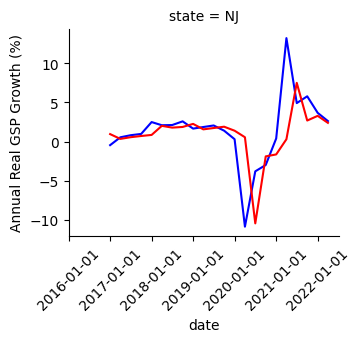

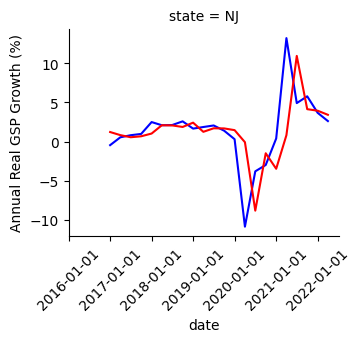

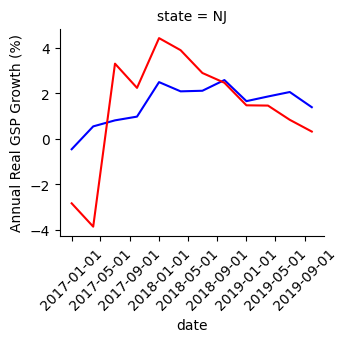

In [15]:
g = sns.FacetGrid(rmse_df_AR1[rmse_df_AR1['state']=="NJ"].reset_index(), col="state", col_wrap=5,sharey=False)
g.map(sns.lineplot, "date","actual_gdp",color="blue",label="Actual GDP")
g.map(sns.lineplot, "date","pred_gdp",color='red')
g.set_axis_labels(y_var="Annual Real GSP Growth (%)")
g.set_xticklabels(rotation=45)
#plt.legend(labels=['Actual GDP', 'Nowcasted GDP'])
plt.show()
g.savefig(charts_folder+"NJ_AR_forecasts.png")

g = sns.FacetGrid(rmse_df_RF1[rmse_df_RF1['state']=="NJ"].reset_index(), col="state", col_wrap=5,sharey=False)
g.map(sns.lineplot, "date","actual_gdp",color="blue",label="Actual GDP")
g.map(sns.lineplot, "date","pred_gdp",color='red')
g.set_axis_labels(y_var="Annual Real GSP Growth (%)")
g.set_xticklabels(rotation=45)
#plt.legend(labels=['Actual GDP', 'Nowcasted GDP'])
plt.show()
g.savefig(charts_folder+"NJ_RF_forecasts.png")

g = sns.FacetGrid(arima_preds[arima_preds['state']=="NJ"].reset_index(), col="state", col_wrap=5,sharey=False)
g.map(sns.lineplot, "date","rgsp_yoy_pchange",color="blue",label="Actual GDP")
g.map(sns.lineplot, "date","predicted_mean",color='red')
g.set_axis_labels(y_var="Annual Real GSP Growth (%)")
g.set_xticklabels(rotation=45)
#plt.legend(labels=['Actual GDP', 'Nowcasted GDP'])
plt.show()
g.savefig(charts_folder+"NJ_ARIMA_forecasts.png")

In [133]:
#arima_preds_test[arima_preds_test['date']<"2020-10-01"]['date'].strftime("%m/%d/%Y")

[dat.strftime("%m/%d/%Y") for dat in arima_preds_test[arima_preds_test['date']<"2020-10-01"]['date']]

['01/01/2020',
 '04/01/2020',
 '07/01/2020',
 '01/01/2020',
 '04/01/2020',
 '07/01/2020',
 '01/01/2020',
 '04/01/2020',
 '07/01/2020',
 '01/01/2020',
 '04/01/2020',
 '07/01/2020',
 '01/01/2020',
 '04/01/2020',
 '07/01/2020',
 '01/01/2020',
 '04/01/2020',
 '07/01/2020',
 '01/01/2020',
 '04/01/2020',
 '07/01/2020',
 '01/01/2020',
 '04/01/2020',
 '07/01/2020',
 '01/01/2020',
 '04/01/2020',
 '07/01/2020',
 '01/01/2020',
 '04/01/2020',
 '07/01/2020',
 '01/01/2020',
 '04/01/2020',
 '07/01/2020',
 '01/01/2020',
 '04/01/2020',
 '07/01/2020',
 '01/01/2020',
 '04/01/2020',
 '07/01/2020',
 '01/01/2020',
 '04/01/2020',
 '07/01/2020',
 '01/01/2020',
 '04/01/2020',
 '07/01/2020',
 '01/01/2020',
 '04/01/2020',
 '07/01/2020',
 '01/01/2020',
 '04/01/2020',
 '07/01/2020',
 '01/01/2020',
 '04/01/2020',
 '07/01/2020',
 '01/01/2020',
 '04/01/2020',
 '07/01/2020',
 '01/01/2020',
 '04/01/2020',
 '07/01/2020',
 '01/01/2020',
 '04/01/2020',
 '07/01/2020',
 '01/01/2020',
 '04/01/2020',
 '07/01/2020',
 '01/01/20

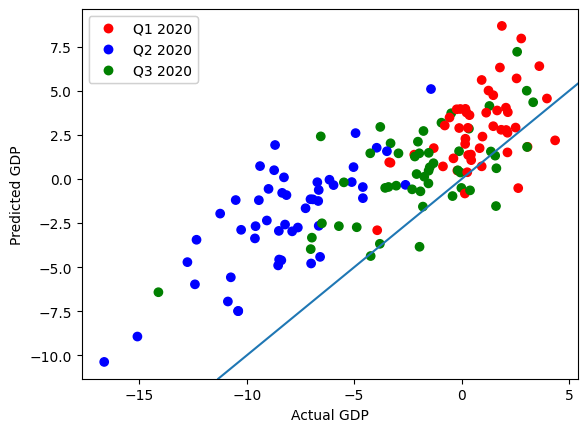

In [147]:
from matplotlib.colors import ListedColormap
fig, ax = plt.subplots(ncols=1)
scatter = ax.scatter(arima_preds_test[arima_preds_test['date']<"2020-10-01"]['rgsp_yoy_pchange'], arima_preds_test[arima_preds_test['date']<"2020-10-01"]['predicted_mean'], c=arima_preds_test[arima_preds_test['date']<"2020-10-01"]['date'],cmap=ListedColormap(['r','b','g']))
legend1 = ax.legend(*scatter.legend_elements(),
                    loc="upper left", labels=['Q1 2020',"Q2 2020","Q3 2020"],
                    handles=scatter.legend_elements()[0])
ax.add_artist(legend1)
ax.axline([0, 0], [1, 1])
ax.set_xlabel('Actual GDP')
ax.set_ylabel('Predicted GDP')
plt.show()
fig.savefig(charts_folder+"ARIMA_preds.png")

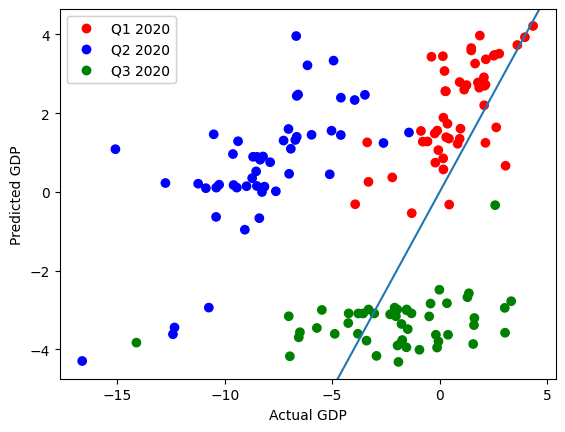

In [155]:
from matplotlib.colors import ListedColormap
fig, ax = plt.subplots(ncols=1)
scatter = ax.scatter(rmse_df_RF_test[rmse_df_RF_test['date']<"2020-10-01"]['actual_gdp'], rmse_df_RF_test[rmse_df_RF_test['date']<"2020-10-01"]['pred_gdp'], c=rmse_df_RF_test[rmse_df_RF_test['date']<"2020-10-01"]['date'],cmap=ListedColormap(['r','b','g']))
legend1 = ax.legend(*scatter.legend_elements(),
                    loc="upper left", labels=['Q1 2020',"Q2 2020","Q3 2020"],
                    handles=scatter.legend_elements()[0])
ax.add_artist(legend1)
ax.axline([0, 0], [1, 1])
ax.set_xlabel('Actual GDP')
ax.set_ylabel('Predicted GDP')
plt.show()
fig.savefig(charts_folder+"RF_preds.png")

In [115]:
arima_preds_test

,date,state,rgsp_yoy_pchange,predicted_mean
0,2020-01-01,AK,-0.200052,0.481179
1,2020-04-01,AK,-8.540016,-4.899172
2,2020-07-01,AK,-6.970036,-3.326314
3,2020-10-01,AK,-4.695487,-2.634204
4,2021-01-01,AK,-4.412031,-1.707558
...,...,...,...,...
5,2021-04-01,WY,4.528952,1.413399
6,2021-07-01,WY,0.466205,-0.103719
7,2021-10-01,WY,2.171178,2.460229
8,2022-01-01,WY,-0.210063,1.438864


In [4]:
reg_data_AR.to_csv(data_folder+"Final/reg_data_final.csv",index=False)